### Assignment MEA

Ana Mafalda Carmo, up202207123  - Leg1: primeiros 4 datasets e questão 2a)b)c); Leg2: Trees.

Rafaela Pinto, up202004330 - Leg1: últimos 3 datasets e questão 2a)b); Leg2: Ensemble, SVM, MLP.

# 1. Produce the following artificial datasets in balanced (50/50) and unbalanced (90/10) class distributions.

# 2. Consider the methods: 1NN, 5NN, 10NN, logistic regression, LDA and QDA.
# a. For each of the suggested datasets rank the listed methods by accuracy on an independent test set.
# b. Explain the results taking into account the assumptions of the methods.

Funções auxiliares para responder às questões:

In [156]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from matplotlib import colors
from sklearn.datasets import make_blobs
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import (
    LinearDiscriminantAnalysis,
    QuadraticDiscriminantAnalysis
)

In [157]:
#visualizar datasets

def plot_dataset_pair(
    X_bal, y_bal,
    X_nbal, y_nbal,
    title
):

    fig, axes = plt.subplots(1,2, figsize=(10,4))

    axes[0].scatter(
        X_bal[:,0], X_bal[:,1],
        c=y_bal,
        cmap="coolwarm",
        alpha=0.6
    )

    axes[0].set_title(f"{title} - Balanced")
    axes[0].axis("equal")

    axes[1].scatter(
        X_nbal[:,0], X_nbal[:,1],
        c=y_nbal,
        cmap="coolwarm",
        alpha=0.6
    )

    axes[1].set_title(f"{title} - Unbalanced")
    axes[1].axis("equal")

    plt.tight_layout()
    plt.show()

In [158]:
# divisão treino/teste
def split_data(X, y):

    return train_test_split(
        X,
        y,
        test_size=0.3,
        random_state=0,
        stratify=y #mantém a proporção das classes no treino e teste
    )

In [159]:
#função usada para plots de knn e lda/qda- para logistic queremos a reta

def plot_classifier_boundary(model, X, h=0.05, ax=None):

    cmap_light = colors.ListedColormap(['lightsteelblue', 'peachpuff'])

    x_min, x_max = X[:, 0].min() - 0.2, X[:, 0].max() + 0.2
    y_min, y_max = X[:, 1].min() - 0.2, X[:, 1].max() + 0.2

    xx, yy = np.meshgrid(
        np.arange(x_min, x_max, h),
        np.arange(y_min, y_max, h)
    )

    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid).reshape(xx.shape)

    ax.contourf(xx, yy, Z, cmap=cmap_light, alpha=0.5)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

In [160]:
def analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name
):

    # SPLIT
    Xb_train, Xb_test, yb_train, yb_test = split_data(X_bal, y_bal)
    Xu_train, Xu_test, yu_train, yu_test = split_data(X_nbal, y_nbal)

    # LOOP NOS K
    for k in [1, 5, 10]:

        # MODELOS
        model_bal = KNeighborsClassifier(n_neighbors=k)
        model_unbal = KNeighborsClassifier(n_neighbors=k)

        model_bal.fit(Xb_train, yb_train)
        model_unbal.fit(Xu_train, yu_train)

        # PREDIÇÕES
        yb_pred = model_bal.predict(Xb_test)
        yu_pred = model_unbal.predict(Xu_test)

        # FIGURAS
        fig, axes = plt.subplots(1, 2, figsize=(10, 4))


        # BALANCED

        plot_classifier_boundary(model_bal, Xb_train, ax=axes[0])

        axes[0].scatter(
            Xb_test[:, 0],
            Xb_test[:, 1],
            c=yb_test,
            cmap='coolwarm',
            edgecolor='k',
            alpha=0.9
        )

        axes[0].set_title(f"Balanced - k={k}")
        axes[0].set_xlabel("$x_1$")
        axes[0].set_ylabel("$x_2$")
        axes[0].grid()


        # UNBALANCED

        plot_classifier_boundary(model_unbal, Xu_train, ax=axes[1])

        axes[1].scatter(
            Xu_test[:, 0],
            Xu_test[:, 1],
            c=yu_test,
            cmap='coolwarm',
            edgecolor='k',
            alpha=0.9
        )

        axes[1].set_title(f"Unbalanced - k={k}")
        axes[1].set_xlabel("$x_1$")
        axes[1].set_ylabel("$x_2$")
        axes[1].grid()

        plt.suptitle(f"{dataset_name} — KNN")
        plt.tight_layout()
        plt.show()


        # MÉTRICAS

        print(f"\n========== {dataset_name} | k={k} ==========")

        print("\nBalanced confusion matrix")
        print(confusion_matrix(yb_test, yb_pred))

        print(
            f"Balanced accuracy: {accuracy_score(yb_test, yb_pred):.3f}"
        )

        print("\nUnbalanced confusion matrix")
        print(confusion_matrix(yu_test, yu_pred))

        print(
            f"Unbalanced accuracy: {accuracy_score(yu_test, yu_pred):.3f}"
        )

In [161]:
def analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name
):

    #função para desenhar a reta e divisão de cores
    def plot_logistic_regression(X, y, model, ax):

        x1_min, x1_max = X[:, 0].min() - 0.2, X[:, 0].max() + 0.2
        x2_min, x2_max = X[:, 1].min() - 0.2, X[:, 1].max() + 0.2

        x1_line = np.linspace(x1_min, x1_max, 300)
        x2_line = np.linspace(x2_min, x2_max, 300)

        X1_mesh, X2_mesh = np.meshgrid(x1_line, x2_line)

        grid = np.c_[X1_mesh.ravel(), X2_mesh.ravel()]
        Y_mesh = model.predict(grid).reshape(X1_mesh.shape)

        cmap_light = mpl.colors.ListedColormap([
            'lightsteelblue', 'peachpuff'
        ])

        ax.contourf(
            X1_mesh,
            X2_mesh,
            Y_mesh,
            cmap=cmap_light,
            alpha=0.5
        )

        ax.scatter(X[:, 0], X[:, 1], c=y, cmap='coolwarm', alpha=0.7)

        a0 = model.intercept_[0]
        a1 = model.coef_[0][0]
        a2 = model.coef_[0][1]

        b = -a0 / a2
        m = -a1 / a2

        x_bound = np.array([x1_min, x1_max])
        y_bound = b + m * x_bound

        ax.plot(x_bound, y_bound, 'r--', linewidth=2)

        ax.set_xlabel('$x_1$')
        ax.set_ylabel('$x_2$')
        ax.grid()


    # split

    Xb_train, Xb_test, yb_train, yb_test = split_data(X_bal, y_bal)
    Xu_train, Xu_test, yu_train, yu_test = split_data(X_nbal, y_nbal)


    # treino

    model_bal = LogisticRegression().fit(Xb_train, yb_train)
    model_unbal = LogisticRegression().fit(Xu_train, yu_train)


    # previsões

    yb_pred = model_bal.predict(Xb_test)
    yu_pred = model_unbal.predict(Xu_test)


    # plots

    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

    plot_logistic_regression(Xb_test, yb_test, model_bal, axs[0])
    axs[0].set_title("Balanced")

    plot_logistic_regression(Xu_test, yu_test, model_unbal, axs[1])
    axs[1].set_title("Unbalanced")

    plt.suptitle(f"{dataset_name} — Logistic Regression")
    plt.tight_layout()
    plt.show()


    # métricas

    print(f"\n========== {dataset_name} ==========")

    print("\nBalanced confusion matrix")
    print(confusion_matrix(yb_test, yb_pred))
    print("Balanced accuracy:", f"{accuracy_score(yb_test, yb_pred):.3f}")

    print("\nUnbalanced confusion matrix")
    print(confusion_matrix(yu_test, yu_pred))
    print("Unbalanced accuracy:", f"{accuracy_score(yu_test, yu_pred):.3f}")

In [162]:
def analyze_lda_qda_dataset(X_bal, y_bal, X_nbal, y_nbal, dataset_name):

    # SPLIT

    X_train_bal, X_test_bal, y_train_bal, y_test_bal = split_data(X_bal, y_bal)
    X_train_nbal, X_test_nbal, y_train_nbal, y_test_nbal = split_data(X_nbal, y_nbal)


    # MODELOS

    lda_bal = LinearDiscriminantAnalysis().fit(X_train_bal, y_train_bal)
    lda_nbal = LinearDiscriminantAnalysis().fit(X_train_nbal, y_train_nbal)

    qda_bal = QuadraticDiscriminantAnalysis().fit(X_train_bal, y_train_bal)
    qda_nbal = QuadraticDiscriminantAnalysis().fit(X_train_nbal, y_train_nbal)


    # PREDIÇÕES

    y_pred_lda_bal = lda_bal.predict(X_test_bal)
    y_pred_qda_bal = qda_bal.predict(X_test_bal)

    y_pred_lda_nbal = lda_nbal.predict(X_test_nbal)
    y_pred_qda_nbal = qda_nbal.predict(X_test_nbal)


    # MÉTRICAS

    print("\nLDA Balanced")
    print(confusion_matrix(y_test_bal, y_pred_lda_bal))
    print(f"Accuracy: {accuracy_score(y_test_bal, y_pred_lda_bal):.3f}")

    print("\nQDA Balanced")
    print(confusion_matrix(y_test_bal, y_pred_qda_bal))
    print(f"Accuracy: {accuracy_score(y_test_bal, y_pred_qda_bal):.3f}")

    print("\nLDA Unbalanced")
    print(confusion_matrix(y_test_nbal, y_pred_lda_nbal))
    print(f"Accuracy: {accuracy_score(y_test_nbal, y_pred_lda_nbal):.3f}")

    print("\nQDA Unbalanced")
    print(confusion_matrix(y_test_nbal, y_pred_qda_nbal))
    print(f"Accuracy: {accuracy_score(y_test_nbal, y_pred_qda_nbal):.3f}")


    # PLOTS BALANCED

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # LDA
    plot_classifier_boundary(lda_bal, X_train_bal, ax=axs[0])
    axs[0].scatter(
        X_test_bal[:, 0],
        X_test_bal[:, 1],
        c=y_test_bal,
        cmap="coolwarm",
        edgecolor='k',
        alpha=0.9
    )
    axs[0].set_title("LDA - Balanced")

    # QDA
    plot_classifier_boundary(qda_bal, X_train_bal, ax=axs[1])
    axs[1].scatter(
        X_test_bal[:, 0],
        X_test_bal[:, 1],
        c=y_test_bal,
        cmap="coolwarm",
        edgecolor='k',
        alpha=0.9
    )
    axs[1].set_title("QDA - Balanced")

    plt.suptitle(f"{dataset_name} — Balanced")
    plt.tight_layout()
    plt.show()


    # PLOTS UNBALANCED

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # LDA
    plot_classifier_boundary(lda_nbal, X_train_nbal, ax=axs[0])
    axs[0].scatter(
        X_test_nbal[:, 0],
        X_test_nbal[:, 1],
        c=y_test_nbal,
        cmap="coolwarm",
        edgecolor='k',
        alpha=0.9
    )
    axs[0].set_title("LDA - Unbalanced")

    # QDA
    plot_classifier_boundary(qda_nbal, X_train_nbal, ax=axs[1])
    axs[1].scatter(
        X_test_nbal[:, 0],
        X_test_nbal[:, 1],
        c=y_test_nbal,
        cmap="coolwarm",
        edgecolor='k',
        alpha=0.9
    )
    axs[1].set_title("QDA - Unbalanced")

    plt.suptitle(f"{dataset_name} — Unbalanced")
    plt.tight_layout()
    plt.show()

# **Headlights: 2 gaussian blobs same covariance with some overlap, 1 class each.**

In [164]:
def generate_headlights(n, balanced):
    np.random.seed(0)

    #proporções
    if balanced:  # dividir 50/50
        nA = n // 2
        nB = n - nA
    else:       # classe A fica com 90% dos dados
        nA = int(n * 0.9)
        nB = n - nA

    #classe A
    #Distribuição gaussiana centrada em (-2, 0)
    XA, _ = make_blobs(
        n_samples=nA,
        centers=[(-2, 0)],
        cluster_std=1.5,  # desvio padrão: controla a sobreposição
        random_state=42
    )

    #classe B
    #Distribuição gaussiana centrada em (2, 0)

    XB, _ = make_blobs(
        n_samples=nB,
        centers=[(2, 0)],
        cluster_std=1.5,
        random_state=43
    )

    X = np.vstack((XA, XB)) # Juntar os dois clusters num único dataset

    y = np.array([0] * nA + [1] * nB) # Criar o vetor de labels: 0 para classe A e 1 para classe B

    return X, y

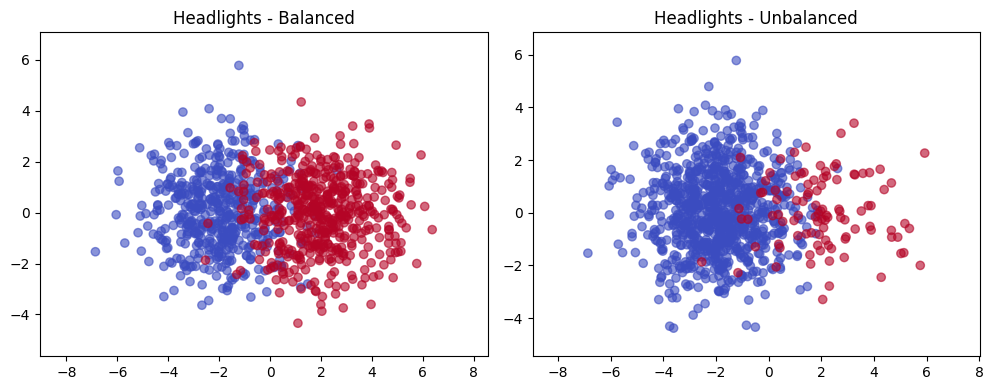

In [165]:
X_bal, y_bal = generate_headlights(1000, True)
X_nbal, y_nbal = generate_headlights(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Headlights"
    )

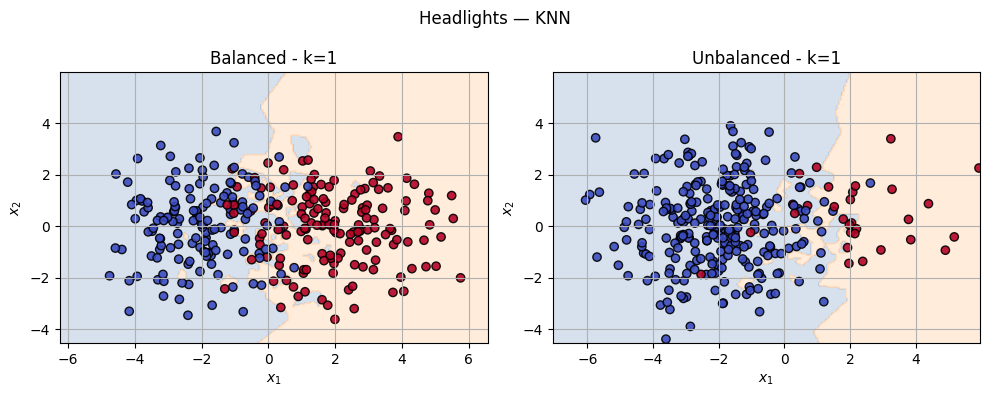


,========== Headlights | k=1 ==========
,
,Balanced confusion matrix
,[[132  18]
, [ 24 126]]
,Balanced accuracy: 0.860
,
,Unbalanced confusion matrix
,[[264   6]
, [ 11  19]]
,Unbalanced accuracy: 0.943


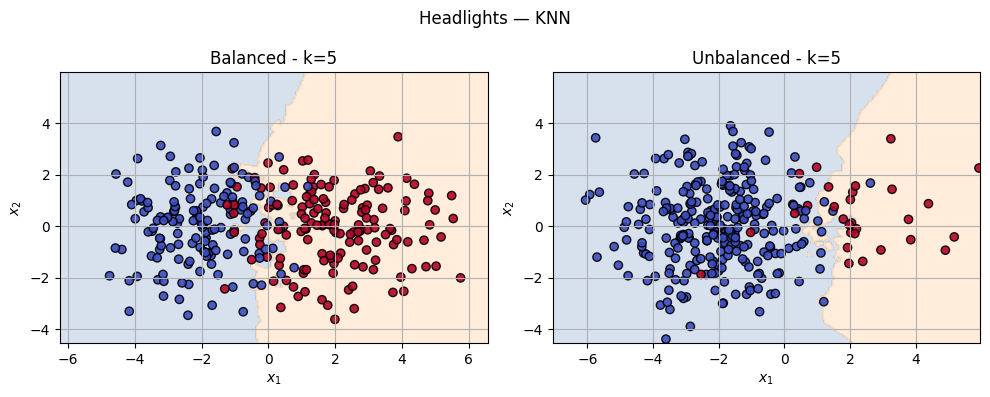


,========== Headlights | k=5 ==========
,
,Balanced confusion matrix
,[[136  14]
, [ 14 136]]
,Balanced accuracy: 0.907
,
,Unbalanced confusion matrix
,[[265   5]
, [ 10  20]]
,Unbalanced accuracy: 0.950


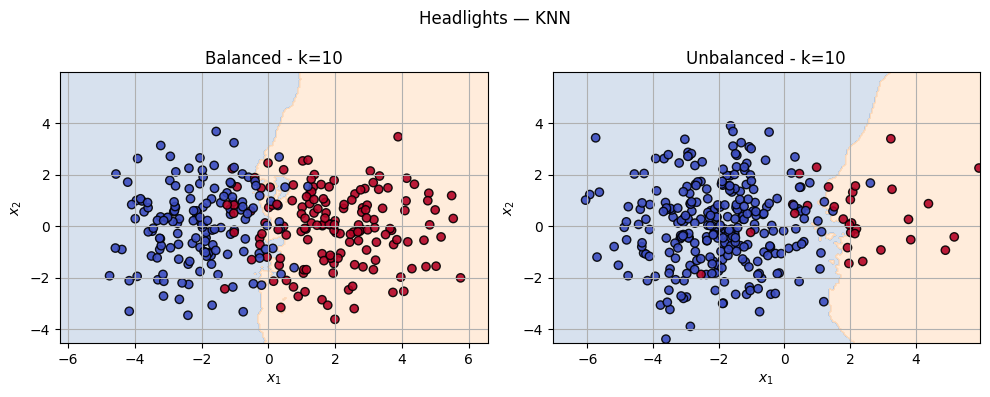


,========== Headlights | k=10 ==========
,
,Balanced confusion matrix
,[[140  10]
, [ 16 134]]
,Balanced accuracy: 0.913
,
,Unbalanced confusion matrix
,[[267   3]
, [  9  21]]
,Unbalanced accuracy: 0.960


In [166]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Headlights"
)


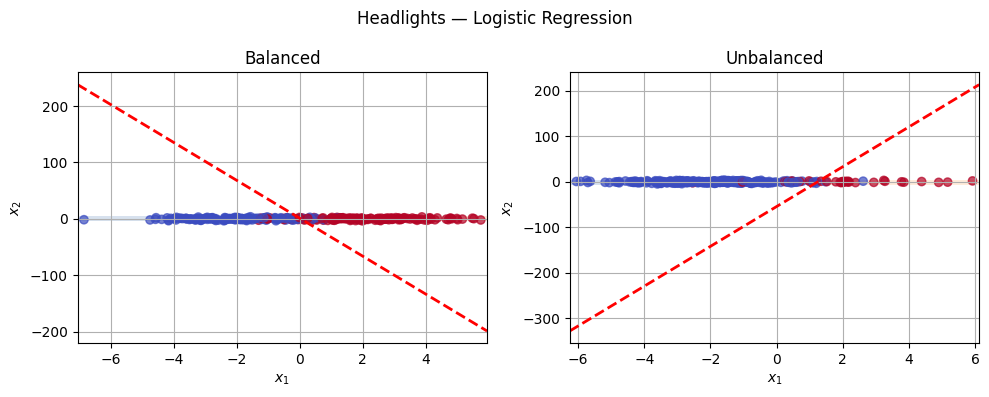


,========== Headlights ==========
,
,Balanced confusion matrix
,[[139  11]
, [ 16 134]]
,Balanced accuracy: 0.910
,
,Unbalanced confusion matrix
,[[267   3]
, [  7  23]]
,Unbalanced accuracy: 0.967


In [167]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Headlights"
)


,LDA Balanced
,[[139  11]
, [ 18 132]]
,Accuracy: 0.903
,
,QDA Balanced
,[[139  11]
, [ 17 133]]
,Accuracy: 0.907
,
,LDA Unbalanced
,[[267   3]
, [  7  23]]
,Accuracy: 0.967
,
,QDA Unbalanced
,[[267   3]
, [  7  23]]
,Accuracy: 0.967


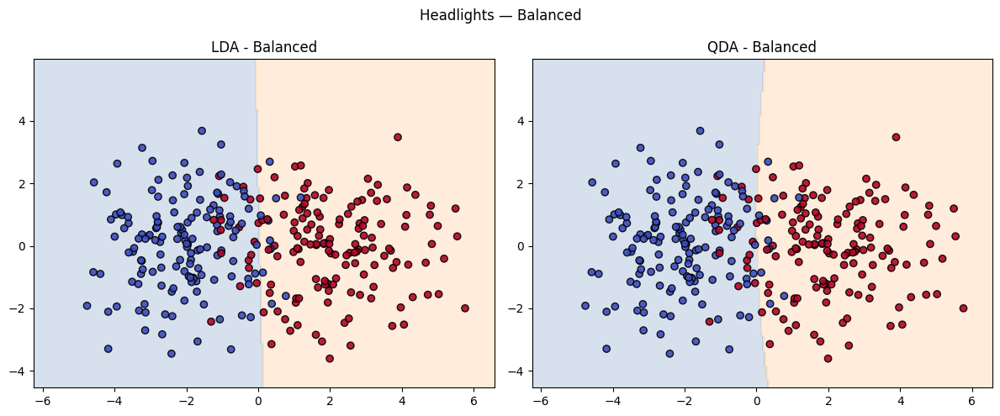

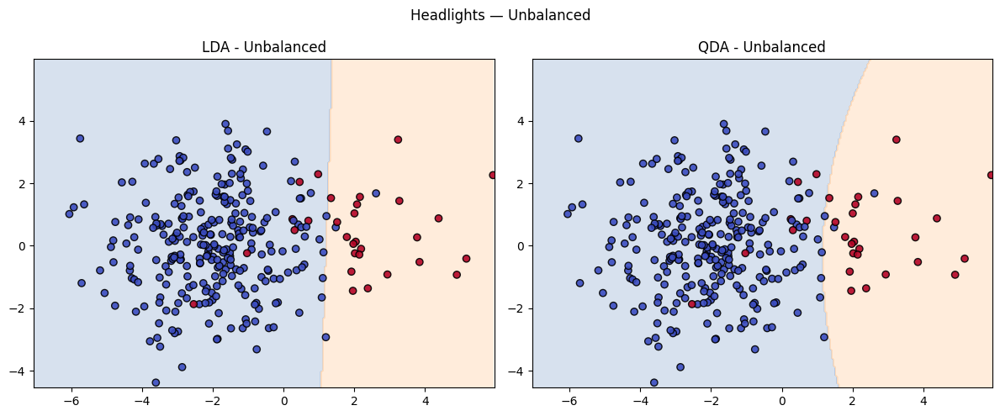

In [168]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Headlights"
)


# **Headlights: ranking e análise**
# Balanced


| Method | Accuracy |                         
|--------|----------|
| 10NN | 0.913 |
| Logistic Regression   | 0.910|
| 5NN/QDA   | 0.907 |
| LDA  | 0.903|
| 1NN  | 0.860 |

<br>

As duas classes correspondem a blobs gaussianos com alguma sobreposição, o que torna o problema mais delicado na região de interseção entre as classes. Ainda assim, todos os métodos apresentam desempenhos elevados.

A fronteira de decisão é aproximadamente linear, favorecendo naturalmente a Logistic Regression. Além disso, os pressupostos do LDA são largamente satisfeitos, uma vez que as classes seguem distribuições aproximadamente gaussianas, apresentam covariâncias semelhantes e as observações são independentes. Por sua vez, o QDA beneficia igualmente da natureza gaussiana dos dados.

O 1-NN sofre apenas muito ligeiramente devido à sua maior sensibilidade às  observações localizadas na região de sobreposição entre as classes (muito baixa proporção de pontos).


# Unbalanced   


| Method | Accuracy |
|--------|----------|
| LDA / QDA / Logistic Regression | 0.967 |
| 10NN   | 0.960 |
| 5NN    | 0.950 |
| 1NN    | 0.943 |

<br>

A análise para o cenário não balanceado é análoga, uma vez que a estrutura geométrica do conjunto de dados se mantém inalterada.

# **Shell: 1 circular gaussian blob (class A) and one somewhat rectangular thin strip of points with the width of the blob (class B) slightly overlapping the edge of the blob.**

In [169]:
def generate_shell(n, balanced):

    np.random.seed(0)

    if balanced:
        nA = n // 2
        nB = n - nA
    else:
        nA = int(n * 0.9)
        nB = n - nA

    # Classe A: blob gaussiano circular centrado em (0,0)
    XA, _ = make_blobs(
        n_samples=nA,
        centers=[(0, 0)],
        cluster_std=1.0,
        random_state=0
    )

    # Classe B: faixa retangular
    x = np.random.uniform(-2.5, 2.5, nB)  # largura semelhante à do blob
    y_strip = np.random.uniform(2, 3, nB)  # faixa vertical estreita

    # Combina x e y para formar pontos 2D
    XB = np.column_stack((x, y_strip))

    # Junta as duas classes
    X = np.vstack((XA, XB))

    # Labels
    y = np.array([0] * nA + [1] * nB)

    return X, y

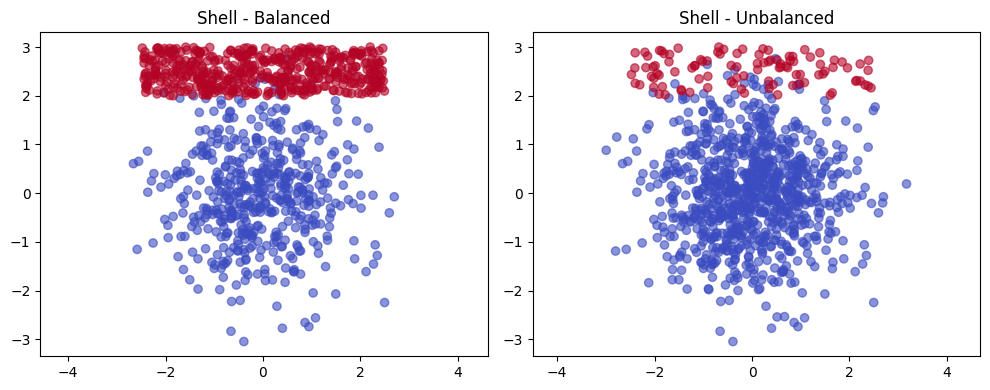

In [170]:
X_bal, y_bal = generate_shell(1000, True)
X_nbal, y_nbal = generate_shell(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Shell"
)

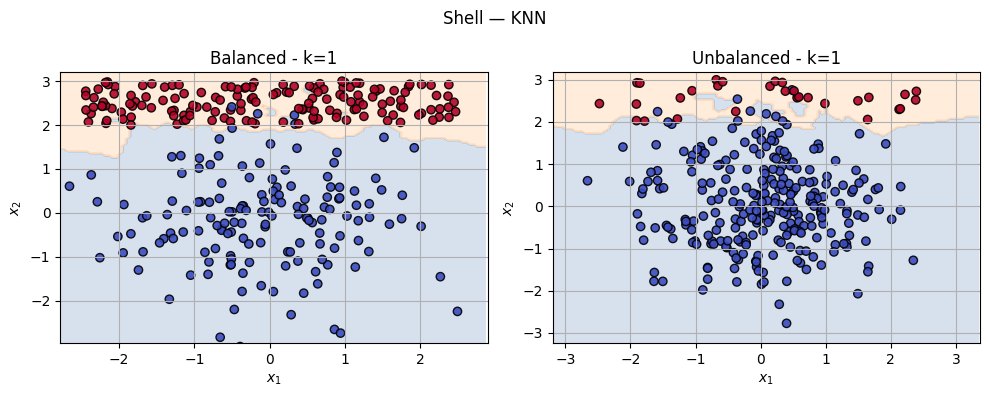


,========== Shell | k=1 ==========
,
,Balanced confusion matrix
,[[146   4]
, [  1 149]]
,Balanced accuracy: 0.983
,
,Unbalanced confusion matrix
,[[262   8]
, [  3  27]]
,Unbalanced accuracy: 0.963


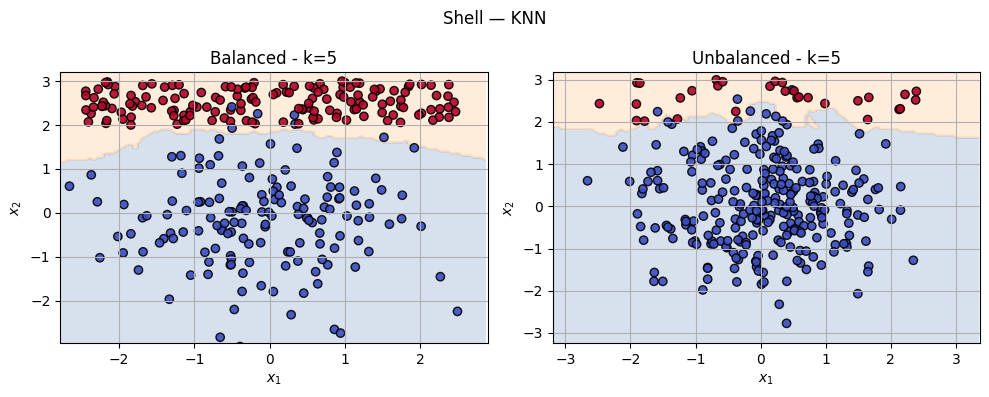


,========== Shell | k=5 ==========
,
,Balanced confusion matrix
,[[144   6]
, [  0 150]]
,Balanced accuracy: 0.980
,
,Unbalanced confusion matrix
,[[263   7]
, [  1  29]]
,Unbalanced accuracy: 0.973


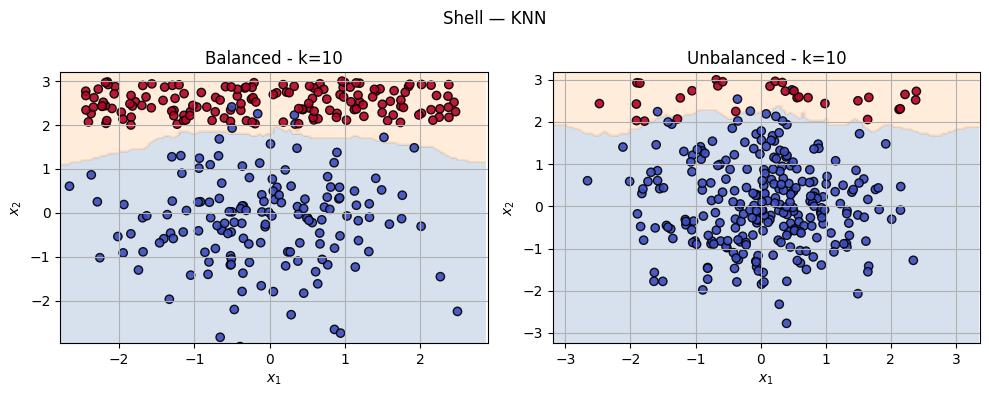


,========== Shell | k=10 ==========
,
,Balanced confusion matrix
,[[144   6]
, [  0 150]]
,Balanced accuracy: 0.980
,
,Unbalanced confusion matrix
,[[266   4]
, [  1  29]]
,Unbalanced accuracy: 0.983


In [171]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Shell"
)

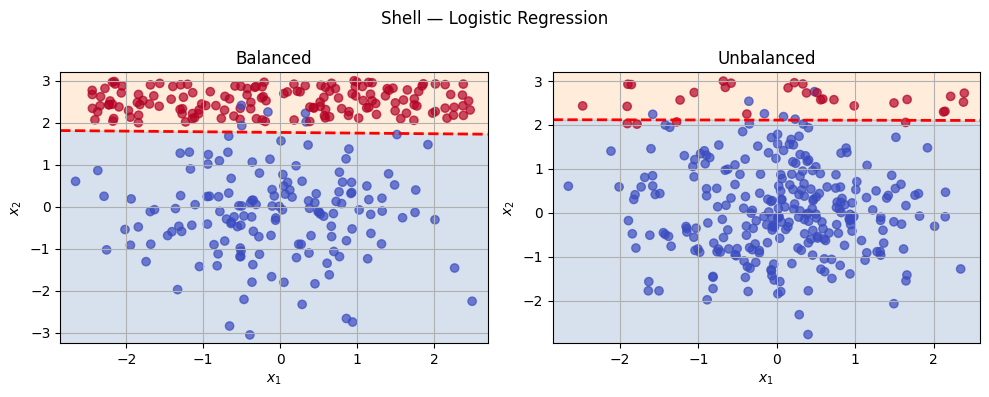


,========== Shell ==========
,
,Balanced confusion matrix
,[[145   5]
, [  0 150]]
,Balanced accuracy: 0.983
,
,Unbalanced confusion matrix
,[[264   6]
, [  4  26]]
,Unbalanced accuracy: 0.967


In [172]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Shell"
)


,LDA Balanced
,[[137  13]
, [  0 150]]
,Accuracy: 0.957
,
,QDA Balanced
,[[145   5]
, [  0 150]]
,Accuracy: 0.983
,
,LDA Unbalanced
,[[261   9]
, [  1  29]]
,Accuracy: 0.967
,
,QDA Unbalanced
,[[264   6]
, [  1  29]]
,Accuracy: 0.977


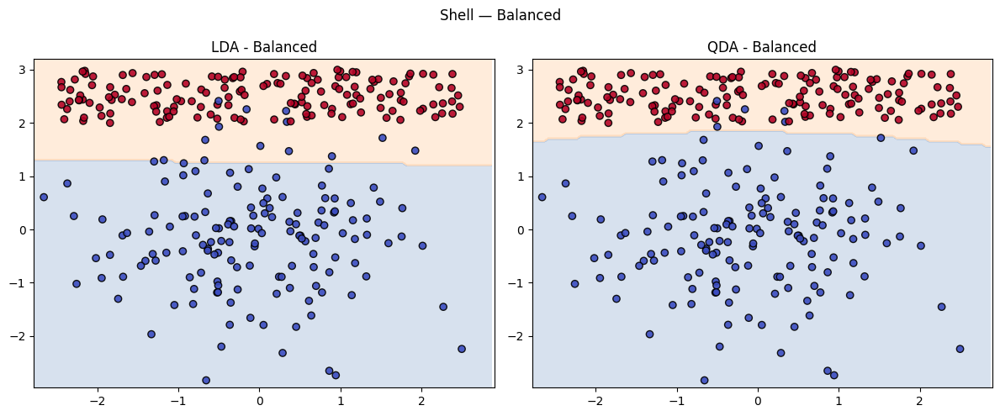

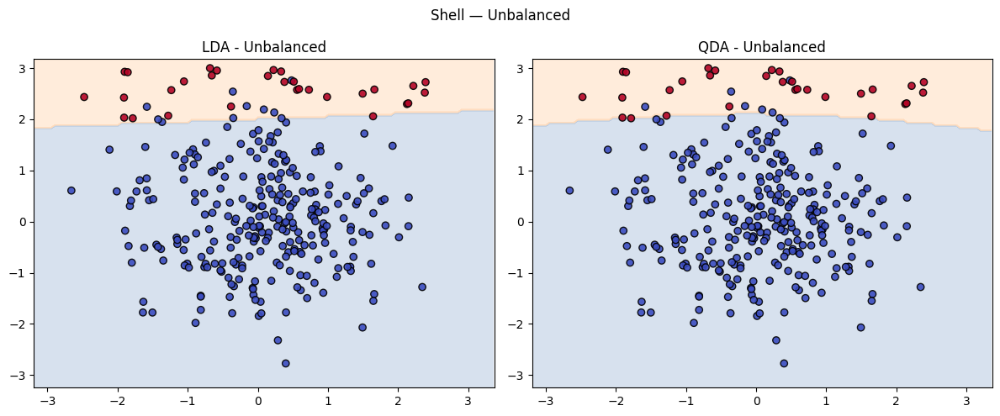

In [173]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Shell"
)

# **Shell: ranking e análise**

# Balanced

| Method | Accuracy |                         
|--------|----------|
| 1NN / QDA / Logistic Regression | 0.983 |
| 5nn / 10NN   | 0.980 |
| LDA | 0.957 |

<br>


# Unbalanced

| Method | Accuracy |                         
|--------|----------|
| 10NN   | 0.983 |
| QDA| 0.977|
|  5NN| 0.973|
| LDA / Logistic Regression | 0.967|
| 1NN   | 0.963 |

<br>

Caso semelhante ao dataset anterior. Apesar de o conjunto de dados não satisfazer estritamente os pressupostos do LDA, as duas classes apresentam uma sobreposição reduzida, o que torna a fronteira de decisão relativamente simples e aproximadamente linear. Consequentemente, todos os métodos alcançam desempenhos elevados e bastante semelhantes.

No cenário não balanceado, a estrutura espacial do dataset mantém-se inalterada, pelo que a separabilidade entre as classes continua elevada. Assim, os resultados obtidos são da mesma natureza.



# **DD: 1 half circular blob, D shaped (class A) and another similar one to the right almost touching but with almost no or minimal overlaping (class B)**

In [174]:
def generate_DD(n, balanced):
    np.random.seed(0)

    if balanced:
      nA = n // 2
      nB = n - nA
    else:
      nA = int(n * 0.9)
      nB = n - nA


    #função auxiliar para criar o "D": meia circunferência preenchida
    def make_D(n_target, shift_x):

      pts = [] # lista para acumular blocos de pontos válidos


      #gerar pontos até atingir o número desejado

      while True:
        X = np.random.uniform(-1, 1, (5000, 2))  # Gera pontos uniformes no quadrado [-1, 1] x [-1, 1]

        mask = (X[:, 0]**2 + X[:, 1]**2 <= 1) & (X[:, 0] >= 0) #metade direita do círculo unitário
        pts.append(X[mask])

        all_pts = np.vstack(pts) #Junta todos os pontos acumulados até agora

        if len(all_pts) >= n_target: #se já tiver pontos suficientes terminar o loop
            break

      all_pts = all_pts[:n_target] #Cortar exatamente para o tamanho desejado
      all_pts[:, 0] += shift_x  #Deslocar o D horizontalmente

      return all_pts


    XA = make_D(nA, shift_x=0.5)   # class A (esquerda)

    XB = make_D(nB, shift_x=1.45)  # class B (direita)

    X = np.vstack([XA, XB])
    y = np.array([0]*nA + [1]*nB)

    return X, y

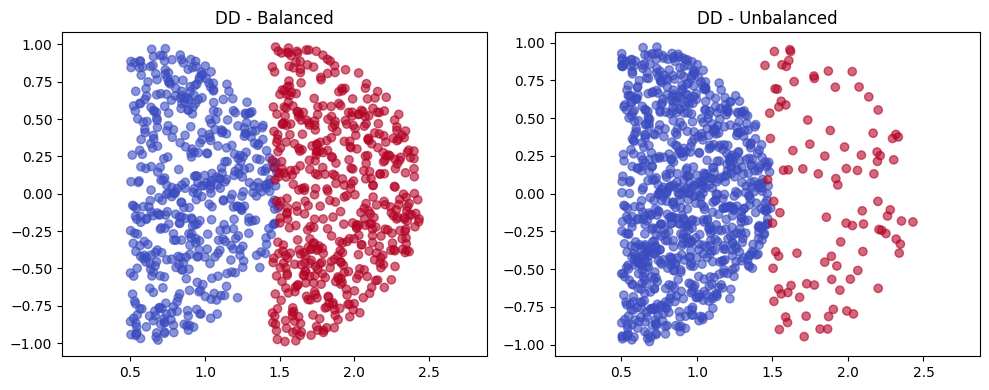

In [175]:
X_bal, y_bal = generate_DD(1000, True)
X_nbal, y_nbal = generate_DD(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "DD"
    )

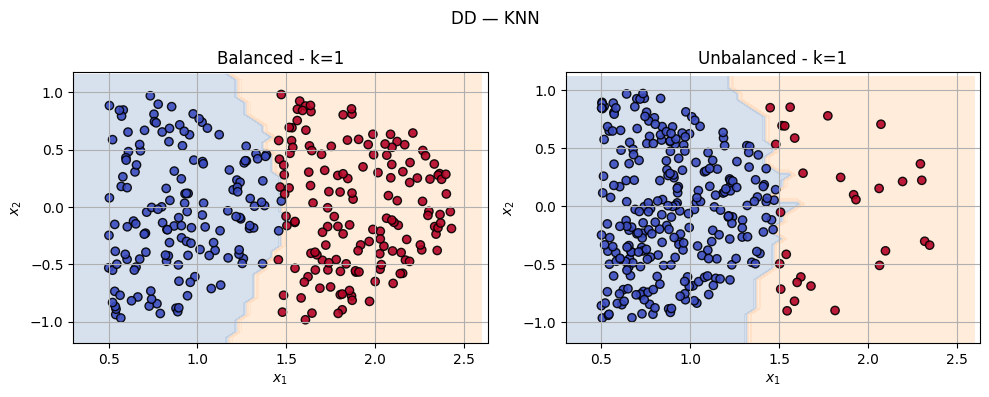


,========== DD | k=1 ==========
,
,Balanced confusion matrix
,[[149   1]
, [  2 148]]
,Balanced accuracy: 0.990
,
,Unbalanced confusion matrix
,[[269   1]
, [  1  29]]
,Unbalanced accuracy: 0.993


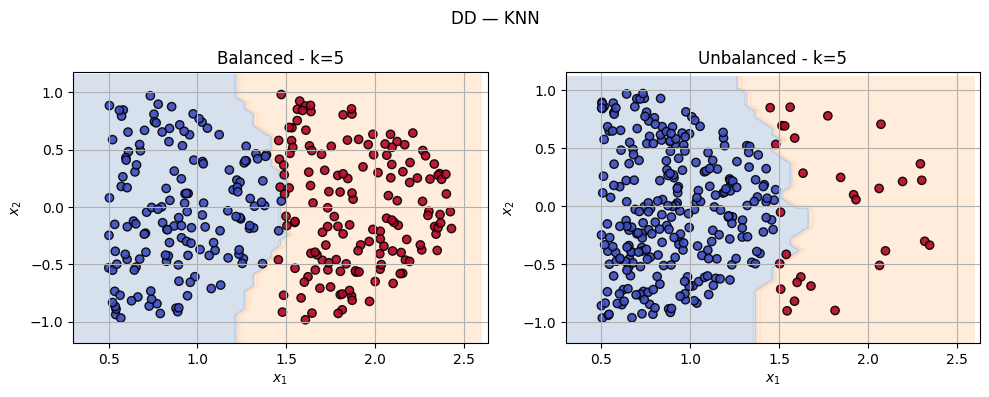


,========== DD | k=5 ==========
,
,Balanced confusion matrix
,[[150   0]
, [  3 147]]
,Balanced accuracy: 0.990
,
,Unbalanced confusion matrix
,[[270   0]
, [  3  27]]
,Unbalanced accuracy: 0.990


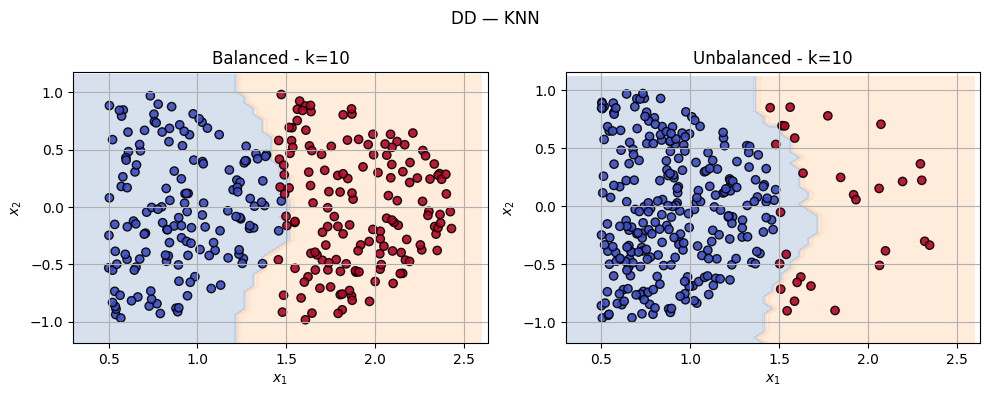


,========== DD | k=10 ==========
,
,Balanced confusion matrix
,[[150   0]
, [  4 146]]
,Balanced accuracy: 0.987
,
,Unbalanced confusion matrix
,[[270   0]
, [  5  25]]
,Unbalanced accuracy: 0.983


In [176]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="DD"
)

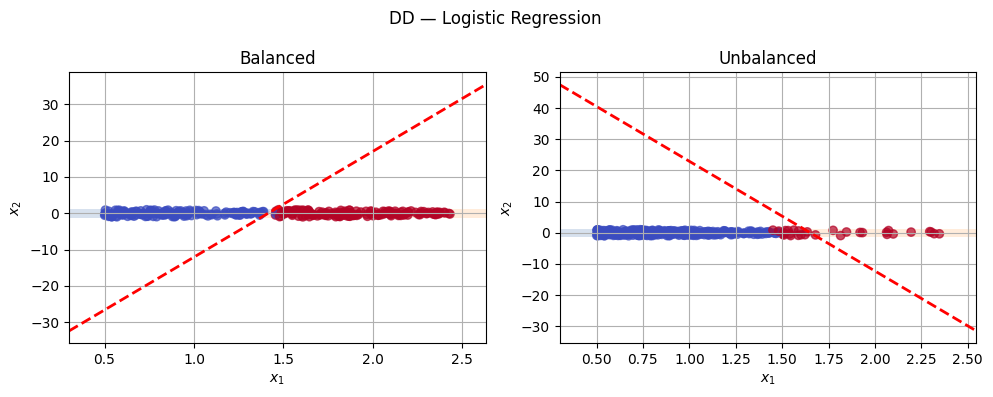


,========== DD ==========
,
,Balanced confusion matrix
,[[148   2]
, [  0 150]]
,Balanced accuracy: 0.993
,
,Unbalanced confusion matrix
,[[270   0]
, [ 15  15]]
,Unbalanced accuracy: 0.950


In [177]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="DD"
)


,LDA Balanced
,[[148   2]
, [  0 150]]
,Accuracy: 0.993
,
,QDA Balanced
,[[148   2]
, [  0 150]]
,Accuracy: 0.993
,
,LDA Unbalanced
,[[270   0]
, [ 11  19]]
,Accuracy: 0.963
,
,QDA Unbalanced
,[[270   0]
, [ 10  20]]
,Accuracy: 0.967


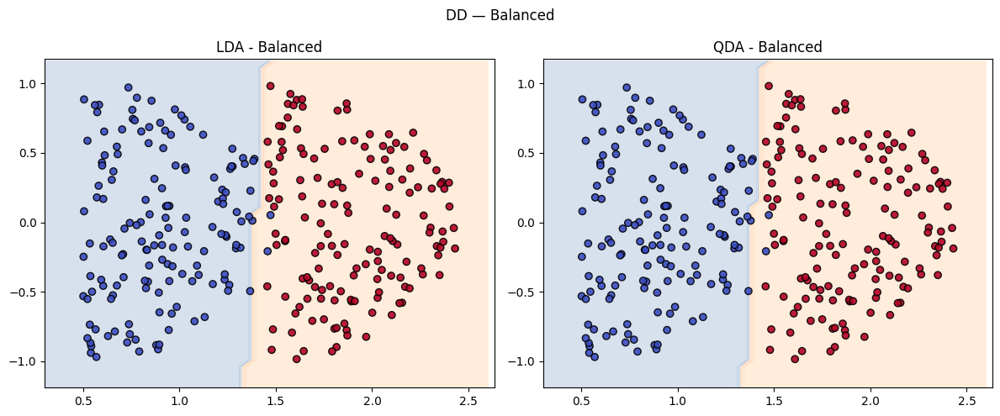

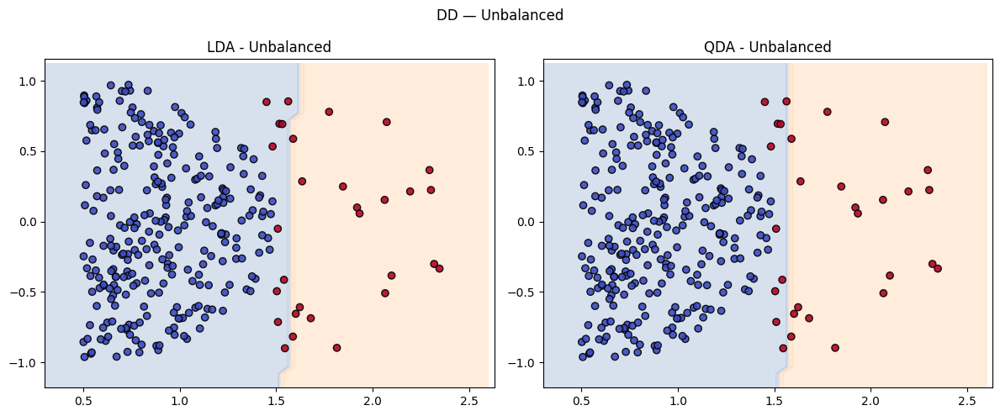

In [178]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="DD"
)

# **DD: ranking e análise**

## Balanced

| Method | Accuracy |                         
|--------|----------|
|  Logistic Regression / LDA / QDA| 0.993|
| 1NN/5NN| 0.990|
| 10NN | 0.987|


<br>

## Unbalanced

| Method | Accuracy |                         
|--------|----------|
| 1NN| 0.993|
| 5NN| 0.990|
| 10NN | 0.983|
| QDA| 0.967|
| LDA| 0.963|
| Logistic Regression| 0.950|


<br>

Caso semelhante aos datasets anteriores, mas com uma separabilidade ainda mais evidente. As duas classes apresentam sobreposição praticamente nula, sendo definidas por regiões geométricas bem distintas. Neste contexto, a fronteira de decisão é não linear, o que favorece métodos não paramétricos como o k-NN.

Apesar de o LDA e a Logistic Regression não capturarem explicitamente esta estrutura não linear, os resultados mantêm-se elevados devido à clara separação geométrica entre as classes.

No cenário não balanceado, a estrutura espacial do dataset mantém-se inalterada, pelo que o desempenho dos classificadores é semelhante ao observado no caso balanceado.

# **Xor: Four alternating squares: a 2 by 2 chess board alternating classes A and B**

In [179]:
def generate_xor(n, balanced):
    np.random.seed(0)

    if balanced:
        nA = n // 2
        nB = n - nA
    else:
        nA = int(n * 0.9)
        nB = n - nA

    #Cada classe dividida por dois quadrados
    nA_half = nA // 2
    nB_half = nB // 2

    #classe A
    A1 = np.random.uniform([0, 0], [1, 1], (nA_half, 2))    # Quadrado inferior esquerdo [0,1]x[0,1]
    A2 = np.random.uniform([1, 1], [2, 2], (nA - nA_half, 2)) # Quadrado superior direito [1,2]x[1,2]
    XA = np.vstack((A1, A2))

    #classe B
    B1 = np.random.uniform([1, 0], [2, 1], (nB_half, 2)) #Quadrado inferior direito [1,2]x[0,1]
    B2 = np.random.uniform([0, 1], [1, 2], (nB - nB_half, 2)) #Quadrado superior esquerdo [0,1]x[1,2]
    XB = np.vstack((B1, B2))

    X = np.vstack((XA, XB))
    y = np.array([0]*nA + [1]*nB)

    return X, y

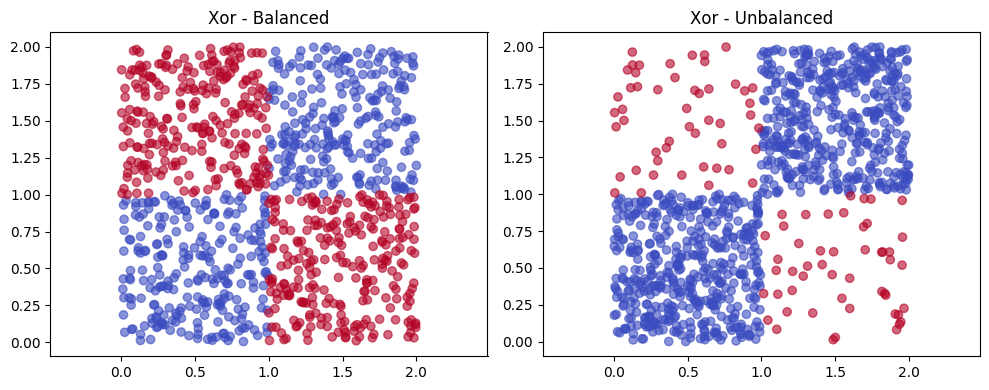

In [180]:
X_bal, y_bal = generate_xor(1000, True)
X_nbal, y_nbal = generate_xor(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Xor"
    )

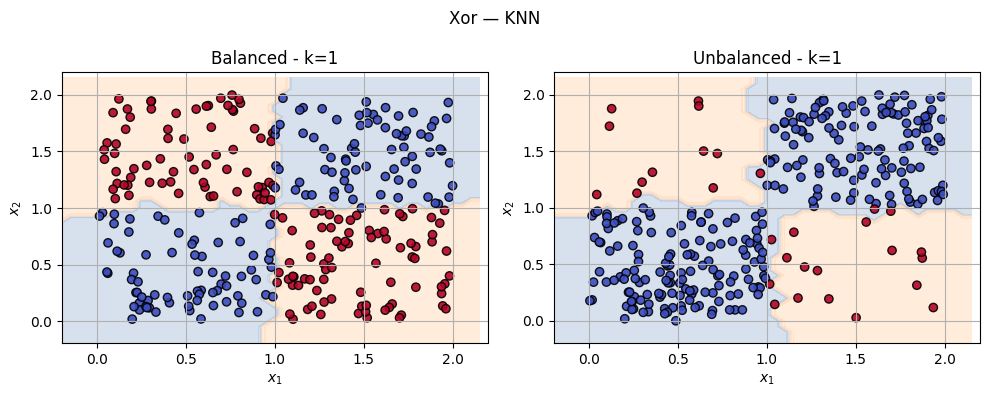


,========== Xor | k=1 ==========
,
,Balanced confusion matrix
,[[145   5]
, [  1 149]]
,Balanced accuracy: 0.980
,
,Unbalanced confusion matrix
,[[268   2]
, [  5  25]]
,Unbalanced accuracy: 0.977


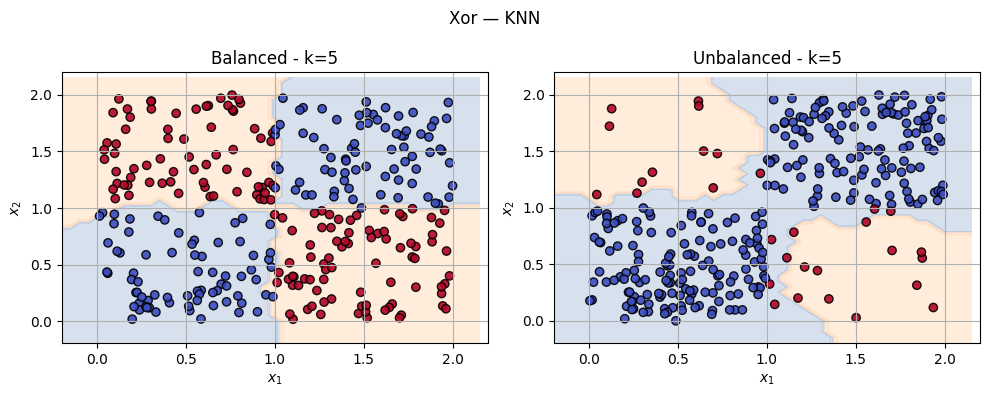


,========== Xor | k=5 ==========
,
,Balanced confusion matrix
,[[143   7]
, [  1 149]]
,Balanced accuracy: 0.973
,
,Unbalanced confusion matrix
,[[270   0]
, [  8  22]]
,Unbalanced accuracy: 0.973


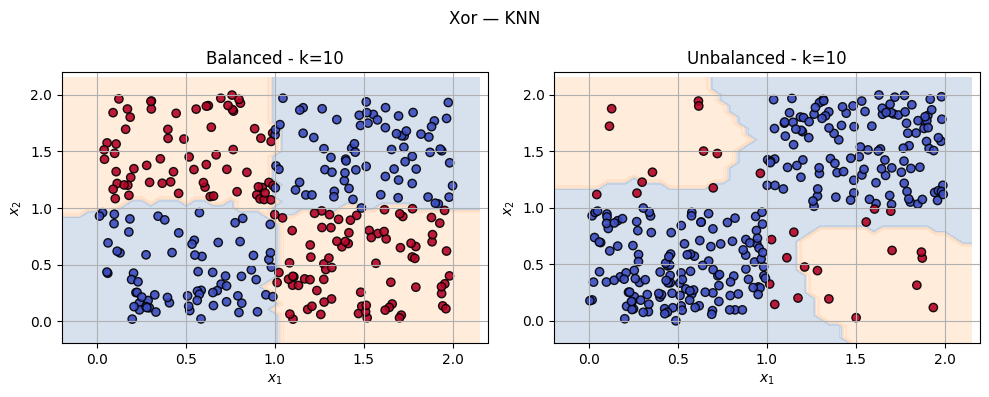


,========== Xor | k=10 ==========
,
,Balanced confusion matrix
,[[147   3]
, [  5 145]]
,Balanced accuracy: 0.973
,
,Unbalanced confusion matrix
,[[270   0]
, [ 14  16]]
,Unbalanced accuracy: 0.953


In [181]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Xor"
)

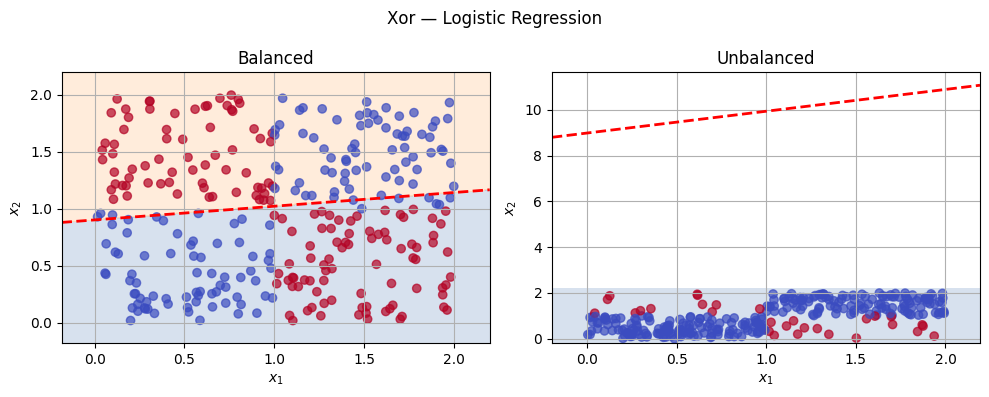


,========== Xor ==========
,
,Balanced confusion matrix
,[[77 73]
, [81 69]]
,Balanced accuracy: 0.487
,
,Unbalanced confusion matrix
,[[270   0]
, [ 30   0]]
,Unbalanced accuracy: 0.900


In [182]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Xor"
)


,LDA Balanced
,[[77 73]
, [81 69]]
,Accuracy: 0.487
,
,QDA Balanced
,[[143   7]
, [  7 143]]
,Accuracy: 0.953
,
,LDA Unbalanced
,[[270   0]
, [ 30   0]]
,Accuracy: 0.900
,
,QDA Unbalanced
,[[270   0]
, [ 19  11]]
,Accuracy: 0.937


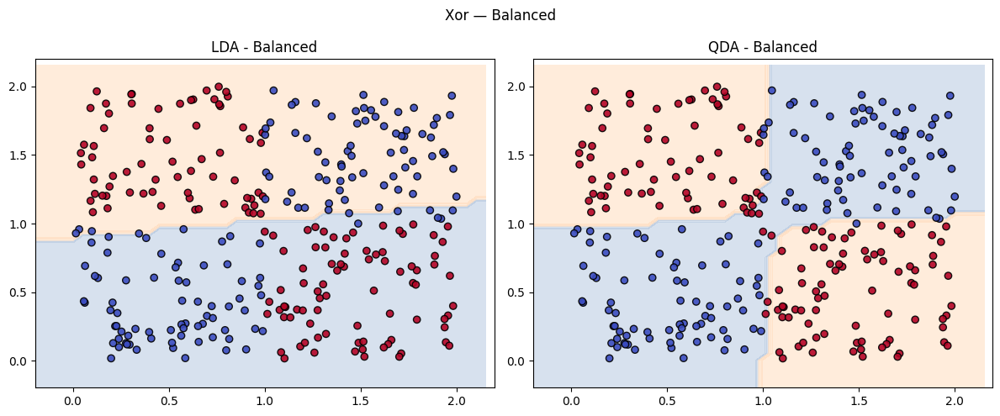

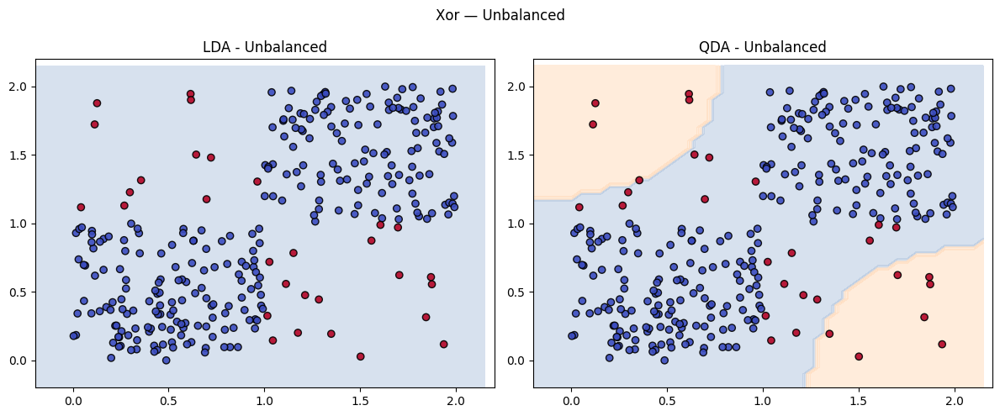

In [183]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Xor"
)

# **Xor: ranking e análise**

# Balanced

| Method | Accuracy |                         
|--------|----------|
| 1NN| 0.980 |
| 5NN / 10NN | 0.973|
| QDA| 0.953|
| LDA| 0.487|
| Logistic Regression| 0.487|

<br>

Os métodos KNN apresentam valores de accuracy elevados uma vez que são modelos não paramétricos e locais, capazes de capturar a alternância espacial das classes sem assumir uma forma global para a fronteira de decisão. Já os restantes métodos apresentam valores significativamente menores.

A Regressão Logística assume uma fronteira de decisão linear entre as classes, o que não é adequado para o problema XOR, uma vez que este apresenta uma estrutura intrinsecamente não linear. Apesar disso, no cenário não balanceado observa-se um aumento artificial da accuracy, o qual não reflete uma melhoria real da capacidade de separação, mas sim um enviesamento do modelo em direção à classe maioritária.

O LDA assume que os dados de cada classe seguem distribuições aproximadamente gaussianas, com a mesma matriz de covariância e uma fronteira de decisão linear. No entanto, no problema XOR estas condições não são verificadas, uma vez que as classes apresentam uma estrutura alternada e não podem ser separadas linearmente. Isto explica o seu desempenho próximo do acaso.

O QDA relaxa a hipótese de covariâncias iguais, permitindo fronteiras quadráticas. No entanto, continua a assumir uma estrutura gaussiana por classe e uma única fronteira global, o que é insuficiente para capturar a natureza fragmentada e não linear do XOR, levando também a um desempenho reduzido.

<br>


## Unbalanced

| Method | Accuracy |                         
|--------|----------|
|  1NN| 0.977|
| 5NN | 0.973|
|  10NN| 0.953|
| QDA | 0.937 |
| Logistic Regression| 0.900|
| LDA | 0.900 |

<br>

Destaca-se o aumento significativo da accuracy dos métodos paramétricos.

No caso da Regressão Logística, quando as classes estão desbalanceadas, o modelo tende a “dar mais importância” à classe maioritária porque ela aparece muito mais vezes durante o treino. Isso faz com que a fronteira de decisão se desloque no sentido da classe minoritária, ficando mais espaço do lado da classe maioritária.

No caso do LDA e do QDA, o desbalanceamento influencia a estimação das probabilidades a priori e, consequentemente, o posicionamento da fronteira de decisão. Como o modelo procura maximizar a verosimilhança global, existe uma tendência para favorecer a classe maioritária, o que resulta também num aumento da região do espaço atribuída a essa classe.

Apesar deste aumento de accuracy, a capacidade dos modelos em capturar a estrutura não linear do XOR não melhora, sendo o resultado sobretudo consequência do desbalanceamento das classes e do impacto deste na métrica de avaliação.




# **Chess4:  Like the one above but 4 by 4, still 2 alternatig classes.**

In [184]:
def generate_chess4(n, balanced):
    np.random.seed(0)

    X = np.random.uniform(0, 4, size=(n, 2)) #cria n linhas e 2 colunas com valores uniformemente distribuidos entre 0 e 4

    grid_x = np.floor(X[:, 0]).astype(int) #pega na parte inteira dos valores na primeira coluna de X (ou seja os valores vao de 0 a 3), length=n
    grid_y = np.floor(X[:, 1]).astype(int) #o mesmo para a segunda coluna

    y = (grid_x + grid_y) % 2 #0+0 0+1 0+2 0+3 || 1+0 1+1 1+2 1+3 .... temos 4x4 opcoes, y sera igual a 0 ou 1, length=n

    # balanceamento - acho que nao funciona muit bem, nao fica os 90/10
    if not balanced:
        idx_class1 = np.where(y == 1)[0] #coloco [0] pois sem isso a funcao where devolve um array com o array com os valores la dentro, da me uma lista das posicoes da class 1
        quantidade_remover = int((0.1*n-len(idx_class1))/(0.1-1)) #a lógica por tras esta nas minhas notas do tele e no caderno de MAE
        remove = idx_class1[:quantidade_remover]
        X = np.delete(X, remove, axis=0) #axis=0, elimina pelas linhas, cada linha de X é uma observacao
        y = np.delete(y, remove)

    return X, y

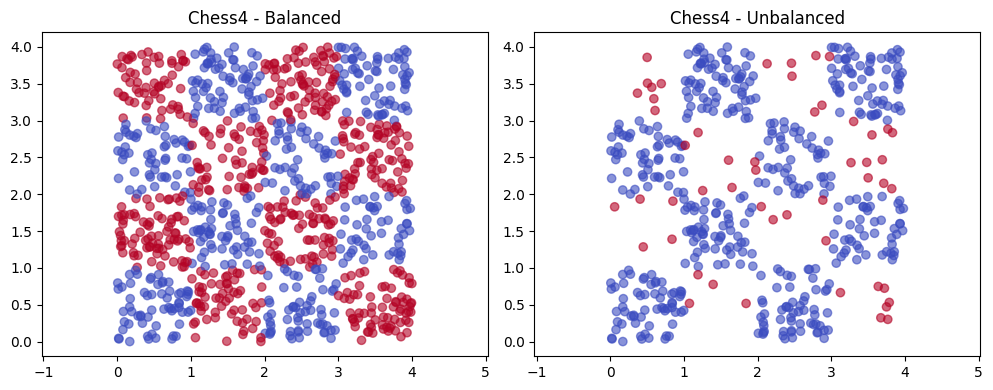

In [185]:
X_bal, y_bal = generate_chess4(1000, True)
X_nbal, y_nbal = generate_chess4(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Chess4"
    )

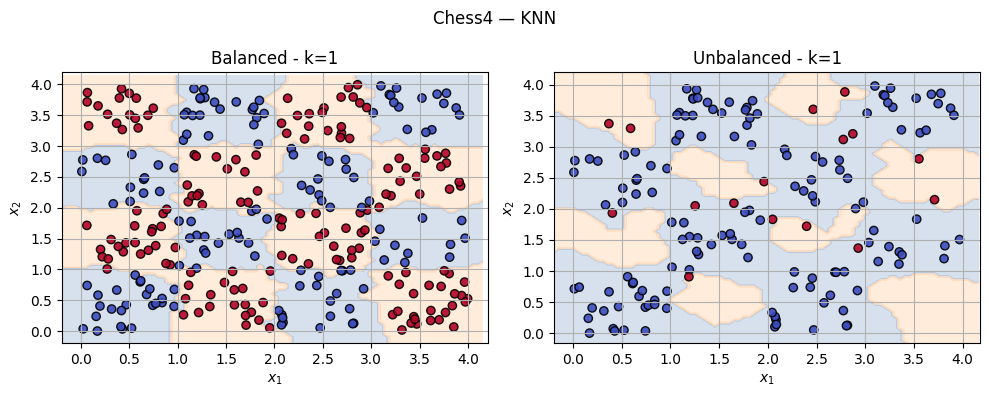


,========== Chess4 | k=1 ==========
,
,Balanced confusion matrix
,[[131   9]
, [  4 156]]
,Balanced accuracy: 0.957
,
,Unbalanced confusion matrix
,[[139   1]
, [  9   7]]
,Unbalanced accuracy: 0.936


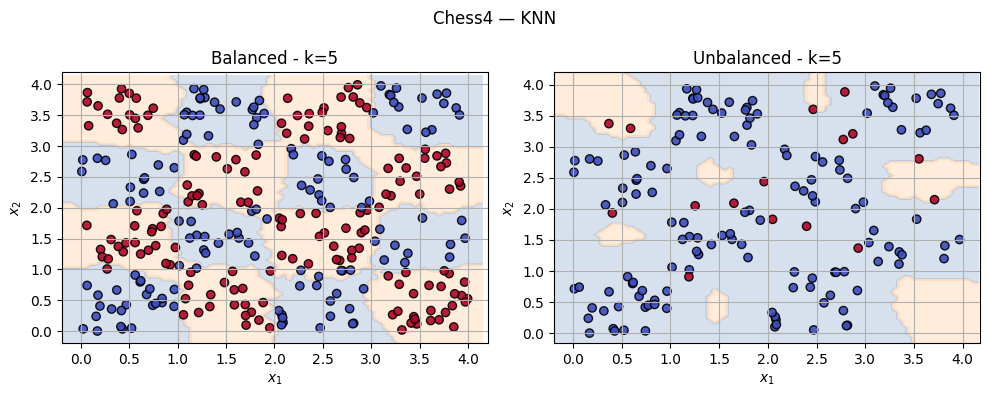


,========== Chess4 | k=5 ==========
,
,Balanced confusion matrix
,[[124  16]
, [  5 155]]
,Balanced accuracy: 0.930
,
,Unbalanced confusion matrix
,[[140   0]
, [ 13   3]]
,Unbalanced accuracy: 0.917


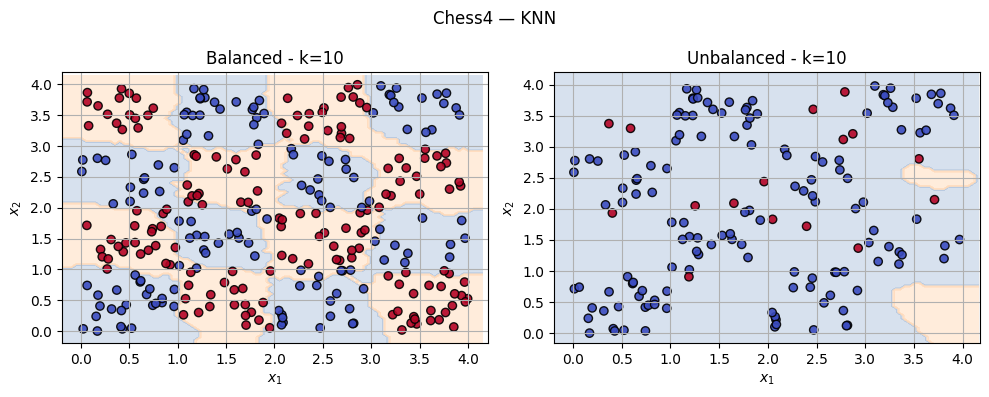


,========== Chess4 | k=10 ==========
,
,Balanced confusion matrix
,[[129  11]
, [ 13 147]]
,Balanced accuracy: 0.920
,
,Unbalanced confusion matrix
,[[140   0]
, [ 16   0]]
,Unbalanced accuracy: 0.897


In [186]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Chess4"
)

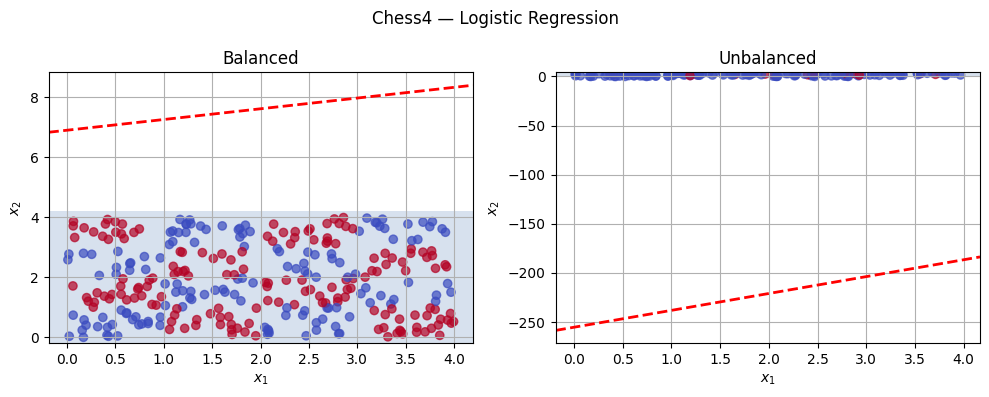


,========== Chess4 ==========
,
,Balanced confusion matrix
,[[  0 140]
, [  0 160]]
,Balanced accuracy: 0.533
,
,Unbalanced confusion matrix
,[[140   0]
, [ 16   0]]
,Unbalanced accuracy: 0.897


In [187]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Chess4"
)


,LDA Balanced
,[[  0 140]
, [  0 160]]
,Accuracy: 0.533
,
,QDA Balanced
,[[ 42  98]
, [ 47 113]]
,Accuracy: 0.517
,
,LDA Unbalanced
,[[140   0]
, [ 16   0]]
,Accuracy: 0.897
,
,QDA Unbalanced
,[[140   0]
, [ 16   0]]
,Accuracy: 0.897


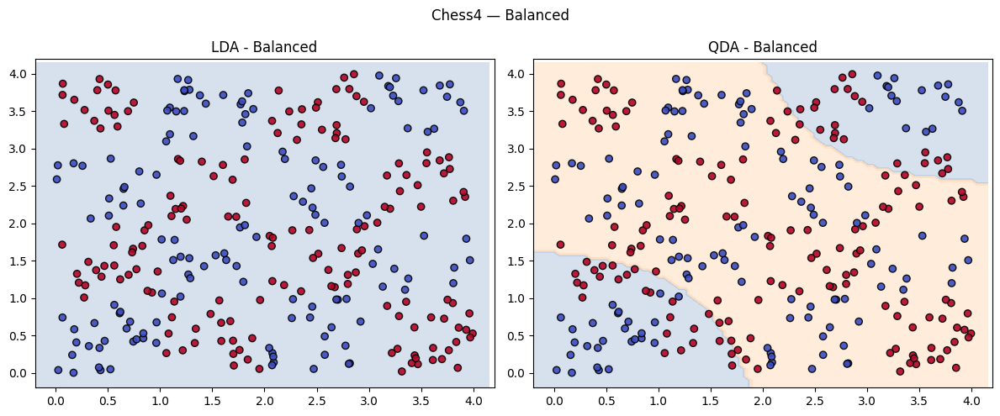

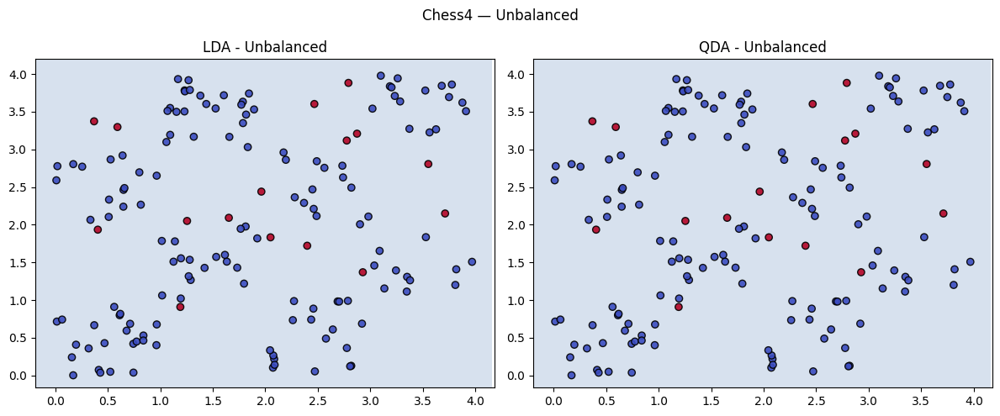

In [188]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Chess4"
)

# **Chess4: ranking e análise**
# Balanced

| Method | Accuracy |                         
|--------|----------|
| 1NN | 0.957|
| 5NN| 0.930 |
|  10NN| 0.920|
| Logistic Regression / LDA| 0.533|
| QDA| 0.517|

<br>

# Unbalanced



| Method | Accuracy |                         
|--------|----------|
|  1NN| 0.936|
| 5NN | 0.917|
| LDA / QDA / 10NN / Logistic Regression | 0.897 |

<br>

Verifica-se, como esperado, um comportamento semelhante ao do XOR 2×2. O LDA e a regressão logística permancema inadequados, uma vez que não conseguem modelar a estrutura não linear e fragmentada do problema. O QDA pode capturar parcialmente a estrutura, mas permanece limitado por assumir uma fronteira global por classe. Em contraste, os métodos kNN mantêm melhor desempenho devido à sua natureza local, sendo mais adequados para padrões altamente não lineares como o Chess4.

# **Roseta2:  1 round central blob (class A), 1 ring around the central blob, like a blob without the central part, where class A is (class B)**

In [189]:
def generate_roseta2(n, balanced):
    np.random.seed(0)

    # gerar ângulos
    theta = np.random.uniform(0, 2*np.pi, n)

    # gerar raio
    r = np.random.uniform(0, 3, n)

    X = np.c_[r * np.cos(theta), r * np.sin(theta)]

    # classes
    y = (r > 1.5).astype(int)

    if not balanced:
        idx_class1 = np.where(y == 1)[0]
        quantidade_remover = int((0.1*n-len(idx_class1))/(0.1-1))
        remove = idx_class1[:quantidade_remover]
        X = np.delete(X, remove, axis=0)
        y = np.delete(y, remove)

    return X, y

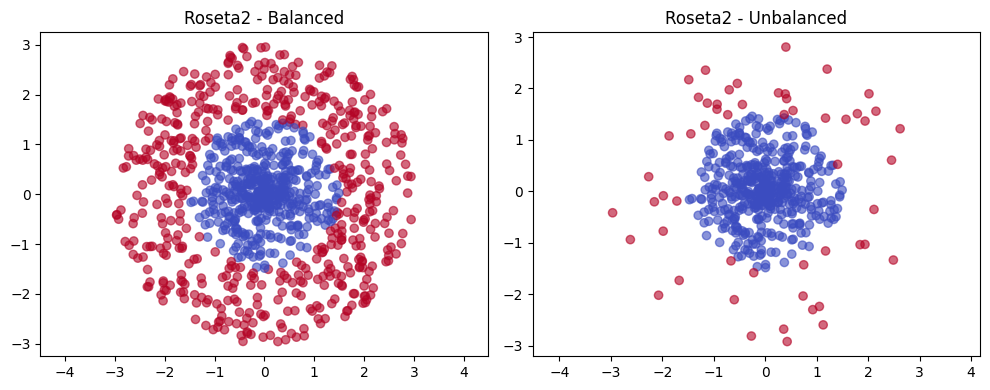

In [190]:
X_bal, y_bal = generate_roseta2(1000, True)
X_nbal, y_nbal = generate_roseta2(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Roseta2"
    )


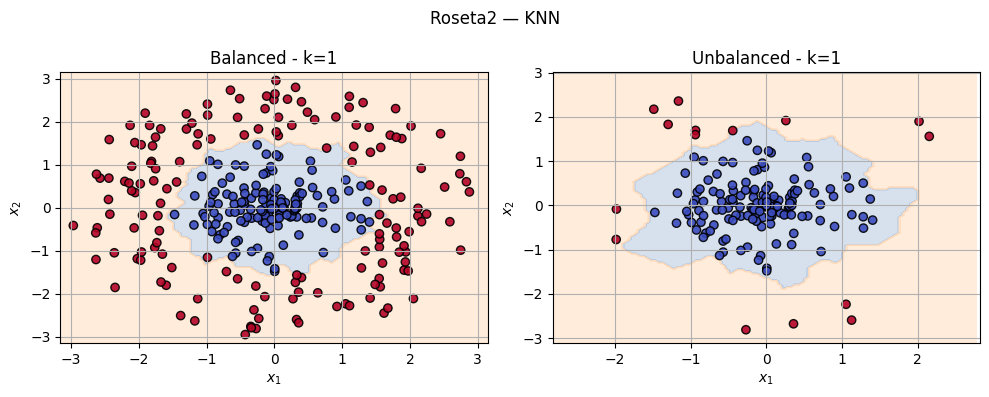


,========== Roseta2 | k=1 ==========
,
,Balanced confusion matrix
,[[141   3]
, [  4 152]]
,Balanced accuracy: 0.977
,
,Unbalanced confusion matrix
,[[145   0]
, [  1  15]]
,Unbalanced accuracy: 0.994


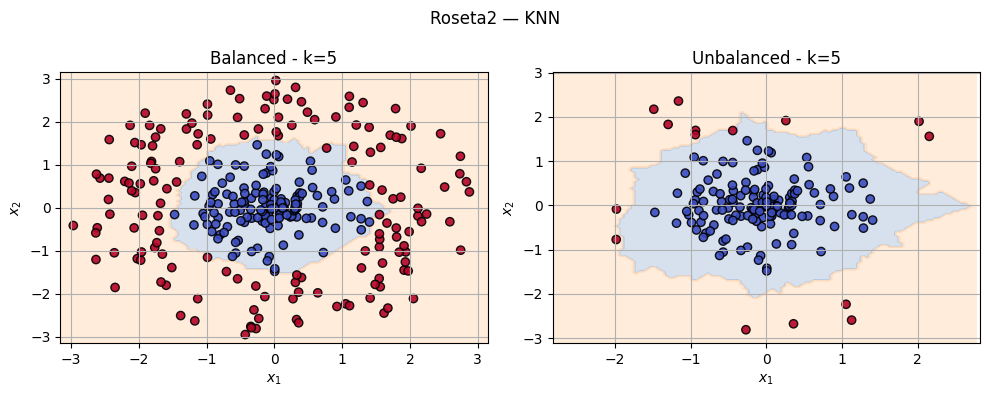


,========== Roseta2 | k=5 ==========
,
,Balanced confusion matrix
,[[142   2]
, [  2 154]]
,Balanced accuracy: 0.987
,
,Unbalanced confusion matrix
,[[145   0]
, [  1  15]]
,Unbalanced accuracy: 0.994


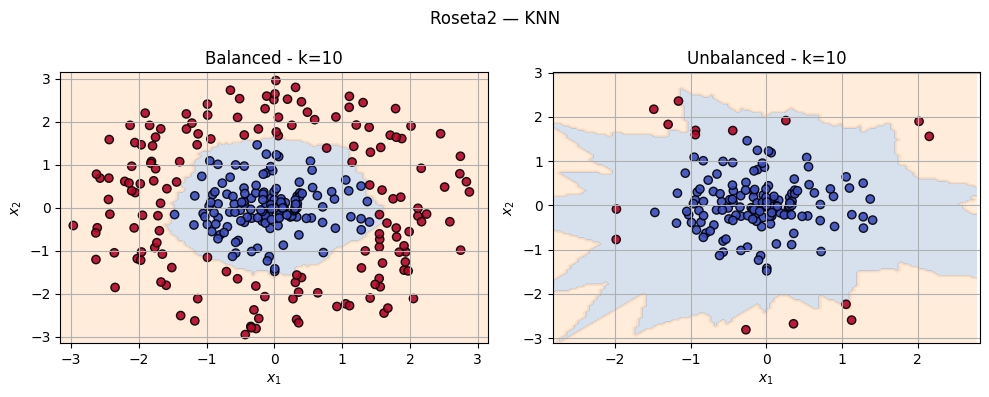


,========== Roseta2 | k=10 ==========
,
,Balanced confusion matrix
,[[144   0]
, [  3 153]]
,Balanced accuracy: 0.990
,
,Unbalanced confusion matrix
,[[145   0]
, [  8   8]]
,Unbalanced accuracy: 0.950


In [191]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta2"
)

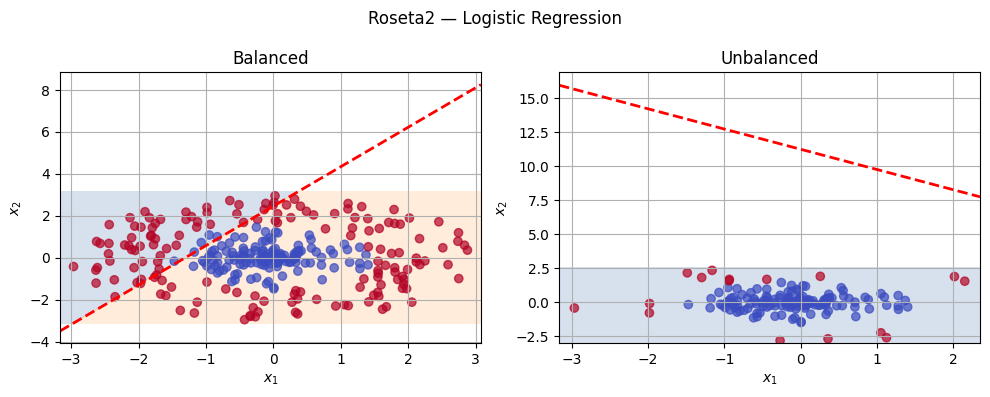


,========== Roseta2 ==========
,
,Balanced confusion matrix
,[[  5 139]
, [ 58  98]]
,Balanced accuracy: 0.343
,
,Unbalanced confusion matrix
,[[145   0]
, [ 16   0]]
,Unbalanced accuracy: 0.901


In [192]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta2"
)


,LDA Balanced
,[[  5 139]
, [ 58  98]]
,Accuracy: 0.343
,
,QDA Balanced
,[[130  14]
, [  0 156]]
,Accuracy: 0.953
,
,LDA Unbalanced
,[[145   0]
, [ 16   0]]
,Accuracy: 0.901
,
,QDA Unbalanced
,[[145   0]
, [  4  12]]
,Accuracy: 0.975


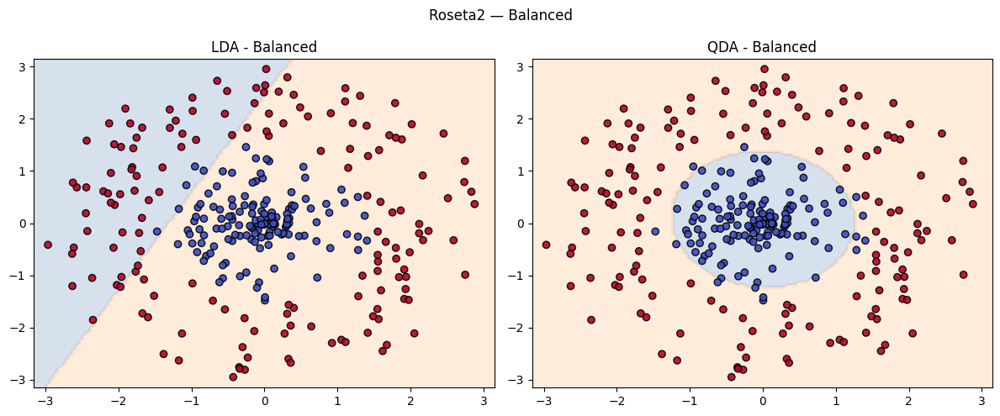

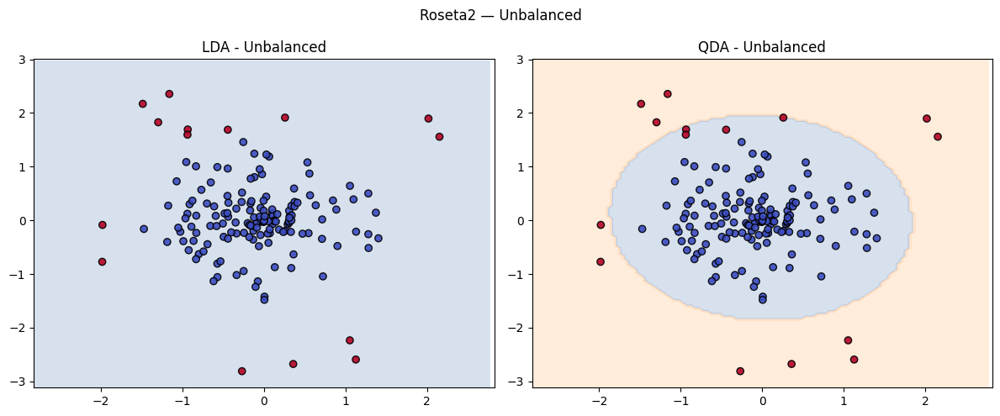

In [193]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta2"
)

# **Roseta2: ranking e análise**

# Balanced

| Method | Accuracy |                         
|--------|----------|
| 10NN | 0.990|
| 5NN| 0.987|
|  1NN| 0.977|
| QDA| 0.953|
| LDA / Logistic Regression| 0.343|

<br>

O método kNN apresenta o melhor desempenho, uma vez que não assume qualquer forma funcional para as classes e realiza uma classificação local, adaptando-se naturalmente à estrutura em anel do conjunto de dados.

O QDA apresenta também um desempenho elevado, uma vez que consegue gerar fronteiras de decisão quadráticas, compatíveis com a geometria aproximadamente circular que separa as duas classes. Apesar disso, a hipótese de normalidade das classes não é totalmente satisfeita, especialmente para a classe em forma de anel, o que explica a diferença de desempenho relativamente ao kNN.

Por outro lado, o LDA e a Regressão Logística apresentam desempenhos reduzidos, uma vez que assumem fronteiras de decisão lineares, claramente inadequadas para separar uma classe central de uma classe em anel.

# Unbalanced

| Method | Accuracy |                         
|--------|----------|
| 1NN / 5NN| 0.994|
| QDA | 0.975 |
|  10NN| 0.950|
| LDA/ Logistic Regression | 0.901|

<br>

No cenário não balanceado, observa-se que o 1NN e o 5NN apresentam melhor desempenho do que o 10NN. Este comportamento pode ser explicado pelo facto de valores mais elevados de K aumentarem a influência da classe maioritária na decisão local, o que pode prejudicar a classificação de observações próximas da fronteira entre as classes.

O QDA mantém um desempenho elevado, uma vez que a fronteira de decisão continua a ser aproximadamente circular. Embora o desbalanceamento afete as probabilidades a priori das classes, a flexibilidade das fronteiras quadráticas permite-lhe continuar a modelar razoavelmente bem a estrutura dos dados.

Para a Regressão Logística e o LDA, observa-se um aumento da accuracy associado ao forte enviesamento em direção à classe maioritária. Nestes métodos, o desbalanceamento desloca a fronteira de decisão e aumenta a região do espaço atribuída à classe dominante, podendo inflacionar a accuracy sem traduzir uma melhoria efetiva da capacidade de separação entre as classes.

# **Roseta3: Same as above, but 3 concentric rings with 2 alternating classes**

In [194]:
def generate_roseta3(n, balanced):
    np.random.seed(0)

    theta = np.random.uniform(0, 2*np.pi, n)
    r = np.random.uniform(0, 3, n)

    X = np.c_[r * np.cos(theta), r * np.sin(theta)]

    # classes alternadas
    y = np.zeros(n)
    y[(r > 1) & (r <= 2)] = 1
    y[(r > 2)] = 0

    y = y.astype(int)

    if not balanced:
        idx_class1 = np.where(y == 1)[0]
        quantidade_remover = int((0.1*n-len(idx_class1))/(0.1-1))
        remove = idx_class1[:quantidade_remover]
        X = np.delete(X, remove, axis=0)
        y = np.delete(y, remove)

    return X, y

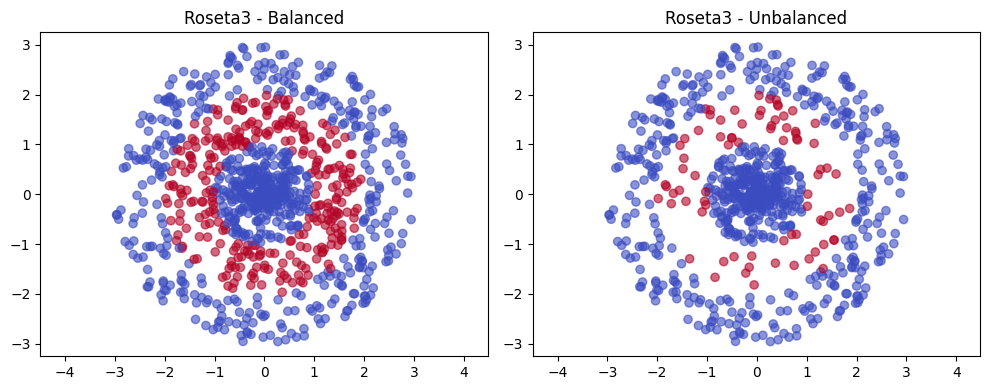

In [195]:
X_bal, y_bal = generate_roseta3(1000, True)
X_nbal, y_nbal = generate_roseta3(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Roseta3"
    )

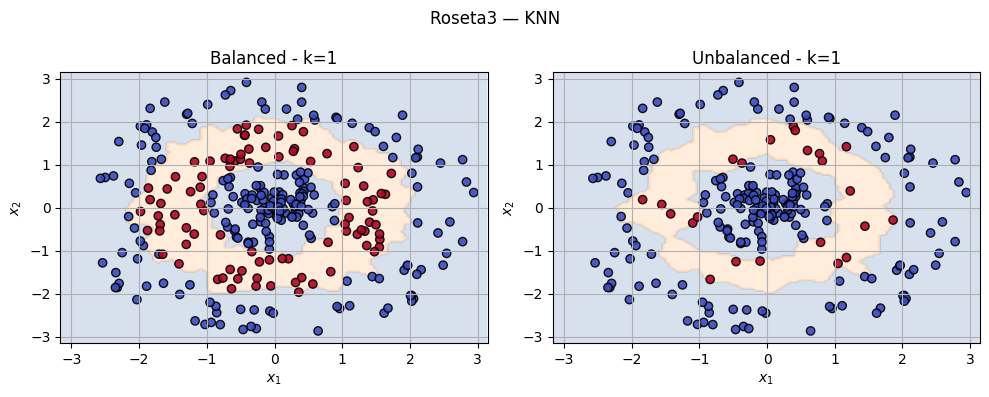


,========== Roseta3 | k=1 ==========
,
,Balanced confusion matrix
,[[205   5]
, [  6  84]]
,Balanced accuracy: 0.963
,
,Unbalanced confusion matrix
,[[210   1]
, [  2  21]]
,Unbalanced accuracy: 0.987


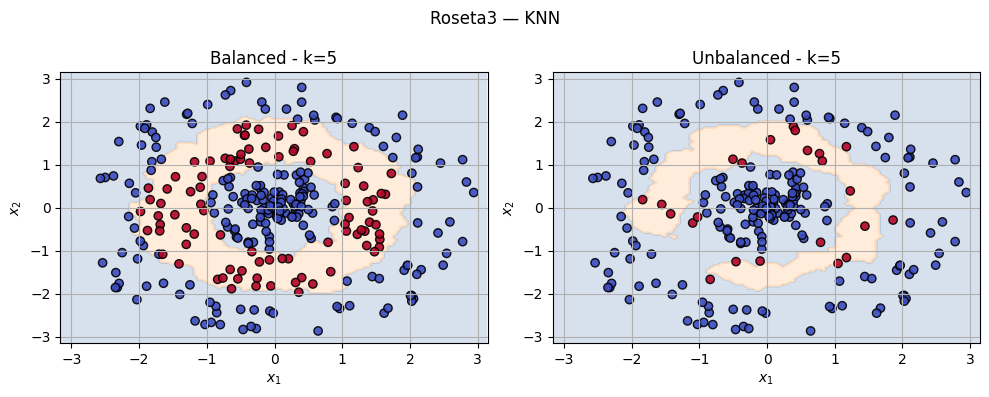


,========== Roseta3 | k=5 ==========
,
,Balanced confusion matrix
,[[208   2]
, [  5  85]]
,Balanced accuracy: 0.977
,
,Unbalanced confusion matrix
,[[211   0]
, [  8  15]]
,Unbalanced accuracy: 0.966


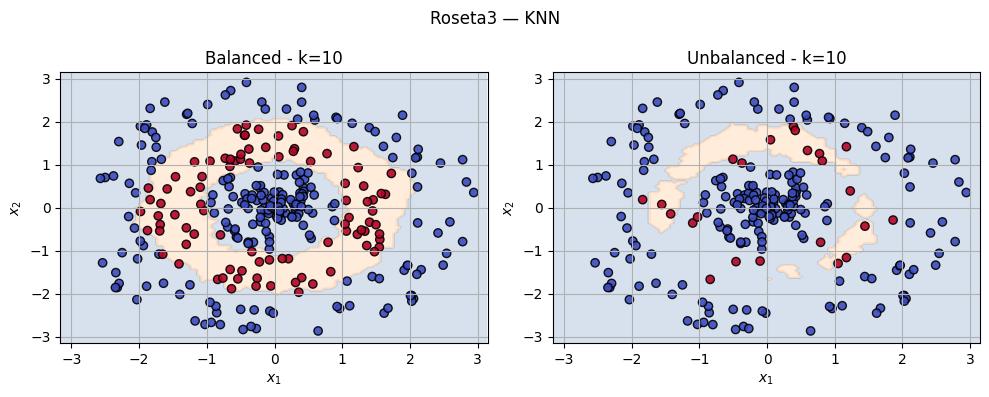


,========== Roseta3 | k=10 ==========
,
,Balanced confusion matrix
,[[209   1]
, [  6  84]]
,Balanced accuracy: 0.977
,
,Unbalanced confusion matrix
,[[211   0]
, [ 14   9]]
,Unbalanced accuracy: 0.940


In [198]:
analyze_knn_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta3"
)

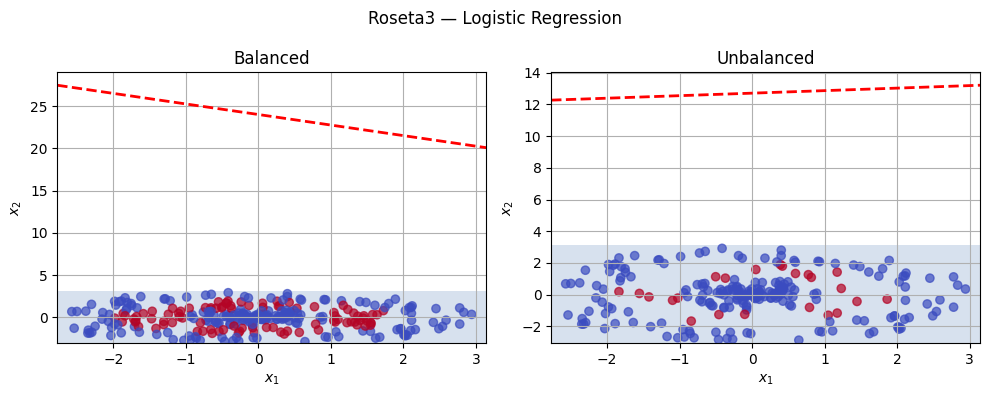


,========== Roseta3 ==========
,
,Balanced confusion matrix
,[[210   0]
, [ 90   0]]
,Balanced accuracy: 0.700
,
,Unbalanced confusion matrix
,[[211   0]
, [ 23   0]]
,Unbalanced accuracy: 0.902


In [199]:
analyze_logistic_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta3"
)


,LDA Balanced
,[[210   0]
, [ 90   0]]
,Accuracy: 0.700
,
,QDA Balanced
,[[210   0]
, [ 90   0]]
,Accuracy: 0.700
,
,LDA Unbalanced
,[[211   0]
, [ 23   0]]
,Accuracy: 0.902
,
,QDA Unbalanced
,[[211   0]
, [ 23   0]]
,Accuracy: 0.902


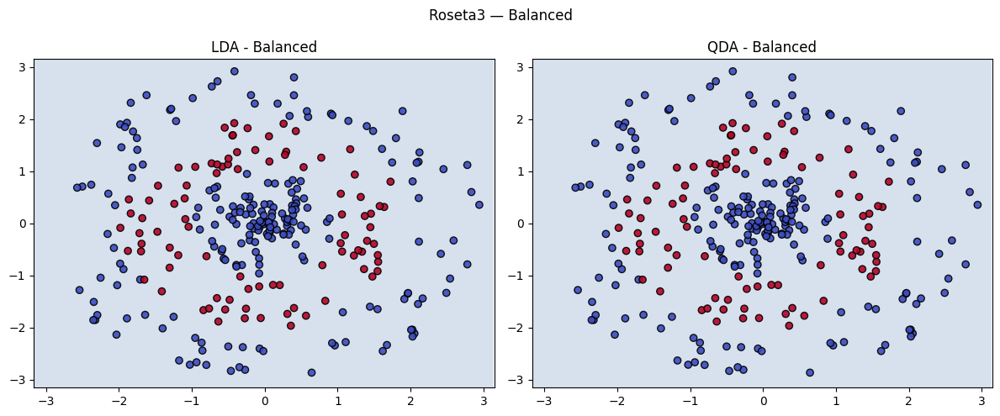

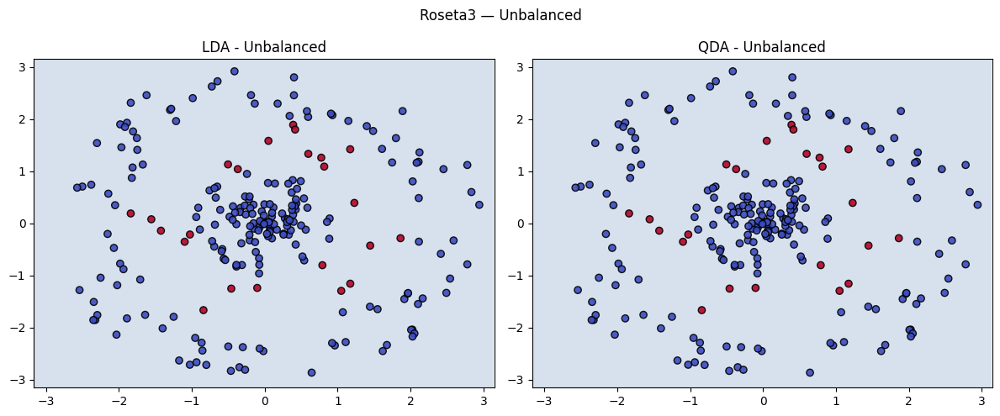

In [200]:
analyze_lda_qda_dataset(
    X_bal, y_bal,
    X_nbal, y_nbal,
    dataset_name="Roseta3"
)

# **Roseta 3: ranking e análise**

# Balanced


| Method | Accuracy |                         
|--------|----------|
| 10NN / 5NN| 0.977|
| 1NN| 0.963|
| LDA/ QDA / Logistic Regression| 0.700|

<br>

# Unbalanced

| Method | Accuracy |                         
|--------|----------|
| 1NN | 0.987|
| 5NN| 0.966|
|  10NN| 0.940|
| LDA/ QDA / Logistic Regression | 0.902|

<br>

Tal como na Roseta2, os métodos kNN apresentam o melhor desempenho, uma vez que não assumem qualquer modelo paramétrico para os dados e adaptam-se localmente à estrutura das classes. No cenário balanceado, valores mais elevados de K produzem fronteiras de decisão mais suaves e menos sensíveis ao ruído, justificando o ligeiro ganho observado para 5NN e 10NN relativamente ao 1NN.

No cenário não balanceado, a situação altera-se. Como existe uma classe claramente dominante, valores elevados de K tendem a incorporar mais observações dessa classe na decisão local, introduzindo viés e reduzindo o desempenho. Consequentemente, o 1NN passa a apresentar a melhor accuracy.

A Regressão Logística e o LDA continuam a apresentar desempenhos modestos, uma vez que assumem fronteiras de decisão lineares, claramente inadequadas para uma estrutura composta por anéis concêntricos.

O QDA também não consegue modelar adequadamente este problema. Embora permita fronteiras quadráticas e tenha obtido bons resultados na Roseta2, aqui cada classe ocupa múltiplos anéis separados. Assim, a hipótese de uma única distribuição gaussiana por classe deixa de ser razoável, limitando a capacidade do modelo para representar a estrutura multimodal dos dados.

Este dataset evidencia as limitações dos modelos paramétricos na presença de estruturas complexas, não lineares e multimodais, enquanto os métodos baseados em vizinhança conseguem adaptar-se mais facilmente à geometria real dos dados.

# **Conclusões gerais:**
Estas análises mostram que a avaliação de modelos de classificação não deve depender apenas da accuracy, especialmente em datasets desbalanceados. O desbalanceamento das classes pode ter um impacto significativo no desempenho observado, introduzindo viés na previsão e podendo levar a interpretações enganadoras dos resultados. Além disso, verifica-se que a estrutura dos dados é determinante no desempenho dos modelos, sendo que padrões não lineares não são adequadamente capturados por modelos lineares, o que evidencia a importância da escolha apropriada do modelo ao problema em análise.

O método kNN apresentou, de forma geral, um desempenho consistente nos diferentes datasets testados, o que sugere que a sua natureza baseada em vizinhança lhe permite adaptar-se melhor a diferentes estruturas de dados, sem assumir uma forma funcional específica para a fronteira de decisão. Contudo este método também tem as suas limitações...

# **C. Suggest 1 dataset that produces a clearly different ranking. Explain the results.**

A nossa proposta para responder a esta questão consistiu na construção de um dataset que penaliza particularmente o desempenho do kNN. Sendo este um método baseado em distâncias e decisões locais, procurou-se aumentar a complexidade do problema através da introdução de sobreposição entre classes e do aumento da dimensionalidade.

Para tal, foram geradas variáveis com elevada variância e correlação entre si, o que aumenta a dispersão dos dados e contribui para a sobreposição entre classes. Adicionalmente, foram introduzidas variáveis aleatórias irrelevantes, aumentando a dimensionalidade do problema e afetando negativamente o kNN devido à maldição da dimensionalidade, uma vez que as distâncias deixam de ser um critério fiável para distinguir observações.

Por fim, cada classe foi gerada a partir de dois clusters Gaussianos distintos, originando distribuições multimodais e uma fronteira de decisão mais complexa. Esta configuração torna o problema mais difícil para métodos baseados em vizinhança, como o kNN, enquanto os modelos paramétricos (LDA, QDA e Regressão Logística) podem apresentar um desempenho relativamente mais estável ao modelarem a estrutura global dos dados.

Com este exemplo, consegue-se evidenciar uma limitação dos métodos locais baseados em vizinhança quando aplicados a problemas com elevada dimensionalidade e presença de variáveis irrelevantes. Em contraste, os métodos paramétricos analisados conseguem explorar a estrutura global dos dados para construir a fronteira de decisão, revelando-se mais adequados neste contexto.

Referências:
https://icd-ufmg.github.io/20-knn/#a-maldi%C3%A7%C3%A3o-da-dimensionalidade

In [201]:

def generate_gaussian_hard(n, balanced=True, class_sep=1.6, noise=0.15):
    np.random.seed(0)

    if balanced:
        nA = n // 2
        nB = n - nA
    else:
        nA = int(n * 0.9)
        nB = n - nA

    # Cada classe é composta por dois subclusters Gaussianos, aumentando a complexidade da distribuição dos dados
    mean_A1 = np.array([-class_sep, -class_sep])
    mean_A2 = np.array([-class_sep, class_sep])

    mean_B1 = np.array([class_sep, class_sep])
    mean_B2 = np.array([class_sep, -class_sep])


    # Matriz de covariância com elevada variância e correlação entre as variáveis, promovendo maior sobreposição entre classes.
    cov = np.array([
    [4.0, 3.5],
    [3.5, 4.0]
    ])


    # Geração dos quatro subclusters Gaussianos.
    XA1 = np.random.multivariate_normal(mean_A1, cov, nA // 2)
    XA2 = np.random.multivariate_normal(mean_A2, cov, nA - nA // 2)

    XB1 = np.random.multivariate_normal(mean_B1, cov, nB // 2)
    XB2 = np.random.multivariate_normal(mean_B2, cov, nB - nB // 2)


    # Construção da matriz de dados e do vetor de classes

    X = np.vstack((XA1, XA2, XB1, XB2))
    y = np.array([0] * nA + [1] * nB)

    # Adição de variáveis aleatórias sem capacidade discriminativa.
    # Estas dimensões extra aumentam a dimensionalidade do problema e dificultam o cálculo de distâncias utilizado pelo KNN.
    # MALDIÇÃO da DIMENSIONALIDADE

    X_noise = np.random.normal(0, 3, size=(len(X), 20))
    X = np.hstack([X, X_noise])

    return X, y

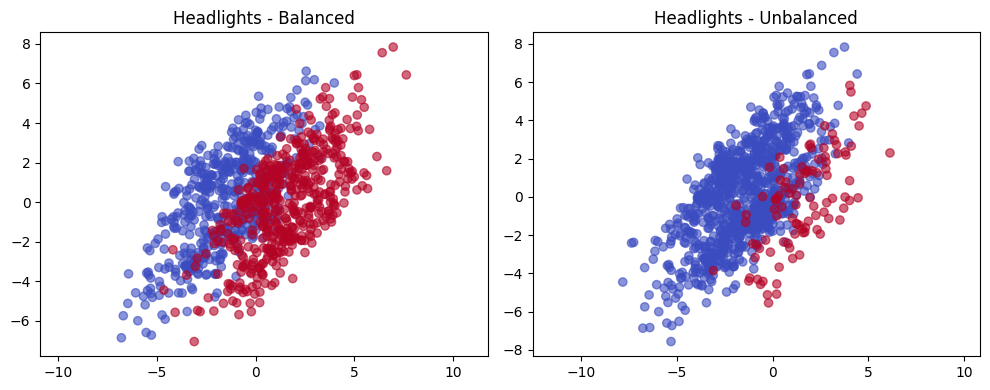

In [202]:
#aspeto do dataset em 2 dimensões apenas

X_bal, y_bal = generate_gaussian_hard(1000, True)
X_nbal, y_nbal = generate_gaussian_hard(1000, False)

plot_dataset_pair(
        X_bal, y_bal,
        X_nbal, y_nbal,
        "Headlights"
    )

In [203]:
def evaluate_models(X, y, dataset_name):

    X_train, X_test, y_train, y_test = split_data(X, y)

    models = {
        "Logistic Regression": LogisticRegression(max_iter=1000),
        "LDA": LinearDiscriminantAnalysis(),
        "QDA": QuadraticDiscriminantAnalysis(),
        "1NN": KNeighborsClassifier(n_neighbors=1),
        "5NN": KNeighborsClassifier(n_neighbors=5),
        "10NN": KNeighborsClassifier(n_neighbors=10)
    }

    print(f"\n=== RESULTS: {dataset_name} ===\n")

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        print(f"{name}: {acc:.3f}")

In [204]:
X_bal, y_bal = generate_gaussian_hard(1000, True)
X_nbal, y_nbal = generate_gaussian_hard(1000, False)

evaluate_models(X_bal, y_bal, "Balanced")
evaluate_models(X_nbal, y_nbal, "Unbalanced")


,=== RESULTS: Balanced ===
,
,Logistic Regression: 0.860
,LDA: 0.843
,QDA: 0.827
,1NN: 0.557
,5NN: 0.633
,10NN: 0.677
,
,=== RESULTS: Unbalanced ===
,
,Logistic Regression: 0.940
,LDA: 0.937
,QDA: 0.917
,1NN: 0.817
,5NN: 0.900
,10NN: 0.900


# Balanced

| Method | Accuracy |                         
|--------|----------|
| Logistic Regression | 0.860|
| LDA| 0.843|
| QDA | 0.827|
| 10NN| 0.677|
|  5NN| 0.633|
| 1NN | 0.557|


# Unbalanced

| Method | Accuracy |                         
|--------|----------|
| Logistic Regression | 0.940|
| LDA| 0.937|
| QDA | 0.917|
| 5NN / 10NN| 0.900|
|  1NN| 0.817|

<br>

Para o dataset balanceado, obtemos o ranking esperado, com a Regressão Logística, o LDA e o QDA a apresentarem melhores resultados do que os classificadores KNN. Este comportamento está de acordo com a forma como o dataset foi construído.

No dataset não balanceado, as accuracies aumentam para todos os classificadores, sendo esta melhoria mais evidente nos métodos KNN. Este comportamento está relacionado com o desbalanceamento das classes, onde aproximadamente 90% das observações pertencem à mesma classe. Nestes cenários, a accuracy tende a aumentar porque uma grande proporção dos exemplos pertence à classe maioritária. Os métodos KNN beneficiam particularmente deste efeito, uma vez que a probabilidade de os vizinhos mais próximos pertencerem à classe dominante é elevada.




 # Study the bias-variance decomposition of Trees, Ensembles, SVM and MLP.

### Use the Breast Cancer Wisconsin dataset;
### Demonstrate the know properties of these methods in terms of bias and variance;
### Show how bias and variance can be tamed;
### Visualize bias, variance and total error;
### Discuss different ways of empirically obtaining the bias variance decomposition.

In [1]:
#importar tudo o que é necessário
import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier as BagC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier as AdaC
from sklearn.svm import SVC  
from sklearn.neural_network import MLPClassifier 
from sklearn.preprocessing import StandardScaler 
from sklearn.pipeline import make_pipeline 
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.base import clone

In [2]:
# Load Breast Cancer Wisconsin dataset
bc = load_breast_cancer()

X = bc.data
y = bc.target

print(X.shape)
print(y.shape)
print(sum(y==1)/569) #proporções das classes
print(sum(y==0)/569)

(569, 30)
(569,)
0.6274165202108963
0.37258347978910367


Podemos calcular empiricamente o viés e a variância usando Repeated Stratified K-Fold Cross Validation (preferimos usar o Repeated Stratified K Fold em vez do Repeated K Fold para mantermos a mesma proporção de classes em cada fold já que este conjunto de dados é moderadamente desiquilibrado, o que nos permite obter uma estimativa do viés e da variância mais confiável):
- 1. Dividimos o conjuntos de dados em k folds com o mesmo tamanho e mesma proporção de classes;
- 2. Usamos k-1 folds para treinar o modelo e o restante fold serve para testar o modelo;
   - Repetimos este passo até todos os folds terem sido usados como teste (uma única vez);
- Depois de repetirmos o procedimento várias vezes, cada observação recebe múltiplas previsões provenientes de modelos treinados em conjuntos de treino diferentes. A partir dessas previsões podemos estimar empiricamente o viés e a variância.

A variância é a variação das previsões dos diferentes conjuntos de treino.
O viés é a diferença entre a média das previsões e o valor real.
E o erro total é a soma do quadrado do viés com a variância e ruído. Mas neste trabalho, como não temos o valor deste ruído, o erro vai ser aproximado e vai ser apenas calculado através da soma do quadrado do viés e da variância. Os valores de viés e variância reportados neste trabalho correspondem a uma aproximação empírica baseada nas probabilidades previstas das classes.

Referências:
https://moodle2526.up.pt/pluginfile.php/260829/mod_resource/content/4/05-Bias-Variance.pdf
https://moodle2526.up.pt/pluginfile.php/260830/mod_resource/content/2/05-evaluation.pdf

In [3]:
def bias_variance_cv(model, X, y, n_splits=10, n_repeats=10):

    # guardar previsões para cada observação
    pred_dict = {i: [] for i in range(len(y))}

    rskf = RepeatedStratifiedKFold(
        n_splits=n_splits,
        n_repeats=n_repeats,
        random_state=3
    )

    for train_idx, test_idx in rskf.split(X, y):

        X_train = X[train_idx]
        X_test = X[test_idx]

        y_train = y[train_idx]

        clf = clone(model)
        clf.fit(X_train, y_train)

        probs = clf.predict_proba(X_test)[:, 1] #probabilidade de observação i pertencer à classe 1

        # guardar previsão de cada observação
        for idx, prob in zip(test_idx, probs):
            pred_dict[idx].append(prob)

    # calcular bias e variance
    bias_list = []
    variance_list = []

    for i in range(len(y)):

        preds = np.array(pred_dict[i])

        mean_pred = np.mean(preds)

        bias_list.append(
            (mean_pred - y[i])**2
        )

        variance_list.append(
            np.var(preds)
        )

    bias_2 = np.mean(bias_list)
    variance = np.mean(variance_list)

    total_error = bias_2 + variance

    return bias_2, variance, total_error

#referência para função RepeatedStratifiedKFold:
#https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RepeatedStratifiedKFold.html

Outra maneira de calcularmos o viés e a variância empiricamente é através do método de Bootstrap, que consiste em:
- Dividir o conjunto de dados num conjunto de treino e de teste;
- Treinar o modelo usando o conjunto de treino, testá-lo com o conjunto de teste, obter valores de viés e variância;
- Repetir isto n vezes.
  
Um possível problema com este método é que pode haver observações que nunca foram usadas para treino ou para teste.

O que podemos esperar dos modelos?

Nas Árvores de Decisão, sabemos que Árvores mais profundas tendem a sobreajustar (overfitting), apresentando baixo viés e elevada variância.

Referências:
https://moodle2526.up.pt/pluginfile.php/260836/mod_resource/content/2/06-Trees.pdf
https://medium.com/@deeno_bajitha/the-bias-variance-tradeoff-in-decision-trees-da241945f958

In [5]:
#Trees

# High variance tree
big_tree = DecisionTreeClassifier(max_depth=None, random_state=0) #usa gini index por default

# Lower variance tree
small_tree = DecisionTreeClassifier(max_depth=3, random_state=0)

Com técnicas de Ensemble (Bagging, Random Forest, Boosting), podemos esperar uma redução de variância em comparação com as Árvores mais profundas. E entre estas técnicas também há diferenças:
- Bagging
  - Obtém B amostras bootstrap do conjunto de dados;
  - Aprende uma Árvore de Decisão de cada amostra;
  - Prevê através da média da resposta dos B modelos. Isto faz com que reduza a variância em relação às Árvores.

- Random Forest (costuma ser melhor que Bagging)
  - Constrói um conjunto de Árvores do conjunto de dados D com N casos e p preditores
  - Em cada iteração i=1, ..., M
    - Obtém uma amostra bootstrap S_i de D
    - Aprende uma Árvore T_i(x) de S_i usando m preditores selecionados ao acaso

Ao selecionar aleatoriamente apenas um subconjunto de variáveis em cada divisão, as árvores tornam-se menos correlacionadas, o que reduz ainda mais a variância do ensemble.

- Boosting (pode ser melhor de Random Forest com bons parâmetros)
  - Aprender um modelo (fraco) a partir dos dados (melhor que adivinhar aleatóriamente, por exemplo, árvore com 1 de profundidade);
  - Ver onde é que o modelo erra nas previsões;
  - Aprender um novo modelo focando nos casos em que a previsão falhou;
  - Combinar os modelos aprendidos até agora;
  - Repetir o processo a partir do passo 2 por um número fixo de iterações.

Referências:
https://moodle2526.up.pt/pluginfile.php/260844/mod_resource/content/0/06-Trees-2-Random-Forests.html

In [6]:
#Bagging
modelBagC=BagC(n_estimators=50, random_state=0)


#Random Forest
rf = RandomForestClassifier(n_estimators=50, random_state=0)


#Boosting
modelAdaC_50=AdaC(n_estimators=50, random_state=0)
modelAdaC_200=AdaC(n_estimators=200, random_state=0)

No caso dos Support Vector Machine (SVM), sabemos que dependendo do kernel que usarmos podemos ter maior ou menor viés/variância. Devemos escolher o kernel mais adequado tendo em conta o tipo de dados que temos.

O kernel Linear é indicado para dados que sejam linearmente separáveis.

O kernel Polynomial é eficiente para problemas com padrões polinomiais.

Já o kernel Radial Basis Function é a escolha habitual para problemas não lineares, pois consegue capturar relações complexas sem conhecimento prévio sobre os dados, mas é muito sensível à escolha dos hiperparâmetros, especialmente do gamma.

Referências:
https://www.geeksforgeeks.org/machine-learning/how-to-choose-the-best-kernel-function-for-svms/

In [8]:
svm_linear_c01 = make_pipeline(
    StandardScaler(),
    SVC(kernel='linear', C=0.1, probability=True, random_state=0)
)
svm_linear_c10 = make_pipeline(
    StandardScaler(),
    SVC(kernel='linear', C=10, probability=True, random_state=0)
)
#com estes dois svm linear, conseguimos ver o efeito do parametro C

svm_poly_g01 = make_pipeline(
    StandardScaler(),
    SVC(kernel='poly', C=10, gamma=0.1, probability=True, random_state=0)
)
svm_poly_g10 = make_pipeline(
    StandardScaler(),
    SVC(kernel='poly', C=10, gamma=10, probability=True, random_state=0)
)
svm_poly_gscale = make_pipeline(
    StandardScaler(),
    SVC(kernel='poly', C=10, gamma='scale', probability=True, random_state=0)
)
#com estes tres svm poly conseguimos ver o efeito do valor gamma


svm_rbf = make_pipeline(
    StandardScaler(),
    SVC(kernel='rbf', C=10, gamma='scale', probability=True, random_state=0)
)
#este serva apenas para comparar este kernel com os outros dois que tem o mesmo valor do parametro C e gamma

#svm usa distancias então é importante fazer scale dos dados
#C controla a penalização dos erros, C mais pequeno -> SVM aceita alguns erros para obter uma fronteira mais simples -> maior bias menor variancia
#Gamma só é relevane em kernels não lineares, Controla o alcance da influência de cada observação, gamma pequeno -> Cada ponto influencia uma região 
#grande -> boundary suave -> maior bias menos variancia
# Probability = True, em vez de identificar a classe mais provavel, indica a probabilidades da observacao ser de cada classe, 
#precisamos disto porque estamos a trabalhar com probabilidades

Quanto a este último modelo, Multi-Layer Perceptron (MLP), esperamos que à medida que aumentamos a capacidade da rede (número de camadas e neurónios), ou seja, aumentamos a complexidade do modelo, o valor da variância aumenta e a diminui o valor do viés.

In [9]:
mlp_small = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        activation='relu',
        hidden_layer_sizes=(5,),
        max_iter=3000,
        random_state=0
    )
)

mlp_large = make_pipeline(
    StandardScaler(),
    MLPClassifier(
        activation='relu',
        hidden_layer_sizes=(50, 50),
        max_iter=3000,
        random_state=0
    )
)

In [10]:
# Bias Variance Study

models = {
    'Deep Tree': big_tree,
    'Shallow Tree': small_tree,
    'Bagging': modelBagC,
    'Random Forest': rf,
    'Boosting_50': modelAdaC_50,
    'Boosting_200': modelAdaC_200,
    'Linear SVM C=01': svm_linear_c01,
    'Linear SVM C=10': svm_linear_c10,
    'Poly SVM G=01': svm_poly_g01,
    'Poly SVM G=10': svm_poly_g10,
    'Poly SVM G=scale': svm_poly_gscale,
    'RBF SVM': svm_rbf,
    'Small MLP': mlp_small,
    'Large MLP': mlp_large
}

results = {}

for name, model in models.items():

    print(f"Running: {name}")
    bias_2, variance, total_error = bias_variance_cv(model, X, y)

    results[name] = {
        'Bias^2': bias_2,
        'Variance': variance,
        'Total Error': total_error
    }


# Results

for name, values in results.items():

    print(f"\n{name}")
    print(f"Bias²: {values['Bias^2']:.4f}")
    print(f"Variance: {values['Variance']:.4f}")
    print(f"Total Error: {values['Total Error']:.4f}")

Running: Deep Tree
Running: Shallow Tree
Running: Bagging
Running: Random Forest
Running: Boosting_50
Running: Boosting_200
Running: Linear SVM C=01
Running: Linear SVM C=10
Running: Poly SVM G=01
Running: Poly SVM G=10
Running: Poly SVM G=scale
Running: RBF SVM
Running: Small MLP
Running: Large MLP

Deep Tree
Bias²: 0.0445
Variance: 0.0310
Total Error: 0.0756

Shallow Tree
Bias²: 0.0470
Variance: 0.0167
Total Error: 0.0637

Bagging
Bias²: 0.0329
Variance: 0.0015
Total Error: 0.0344

Random Forest
Bias²: 0.0305
Variance: 0.0010
Total Error: 0.0315

Boosting_50
Bias²: 0.1087
Variance: 0.0005
Total Error: 0.1092

Boosting_200
Bias²: 0.1276
Variance: 0.0003
Total Error: 0.1279

Linear SVM C=01
Bias²: 0.0204
Variance: 0.0004
Total Error: 0.0208

Linear SVM C=10
Bias²: 0.0257
Variance: 0.0012
Total Error: 0.0269

Poly SVM G=01
Bias²: 0.0453
Variance: 0.0021
Total Error: 0.0473

Poly SVM G=10
Bias²: 0.0490
Variance: 0.0022
Total Error: 0.0511

Poly SVM G=scale
Bias²: 0.0290
Variance: 0.0006


In [11]:
from sklearn.model_selection import cross_val_score

for name, model in [
    ("Deep Tree", big_tree),
    ("Shallow Tree", small_tree),
    ("Bagging", modelBagC),
    ("Random Forest", rf),
    ("Boosting_50", modelAdaC_50),
    ("Boosting_200", modelAdaC_200),
    ("Linear SVM C=01", svm_linear_c01),
    ("Linear SVM C=10", svm_linear_c10),
    ("Poly SVM G=01", svm_poly_g01),
    ("Poly SVM G=10", svm_poly_g10),
    ("Poly SVM G=scale", svm_poly_gscale),
    ("RBF SVM", svm_rbf),
    ("Small MLP", mlp_small),
    ("Large MLP", mlp_large)
]:

    score = cross_val_score(
        model,
        X,
        y,
        cv=10,
        scoring='accuracy'
    )

    print(name, score.mean())

Deep Tree 0.9174498746867167
Shallow Tree 0.9104636591478696
Bagging 0.956140350877193
Random Forest 0.9596177944862155
Boosting_50 0.9683270676691729
Boosting_200 0.9806077694235589
Linear SVM C=01 0.9788847117794486
Linear SVM C=10 0.9701441102756891
Poly SVM G=01 0.9437343358395991
Poly SVM G=10 0.9384398496240604
Poly SVM G=scale 0.9543233082706765
RBF SVM 0.9736528822055138
Small MLP 0.9788847117794484
Large MLP 0.9753759398496239


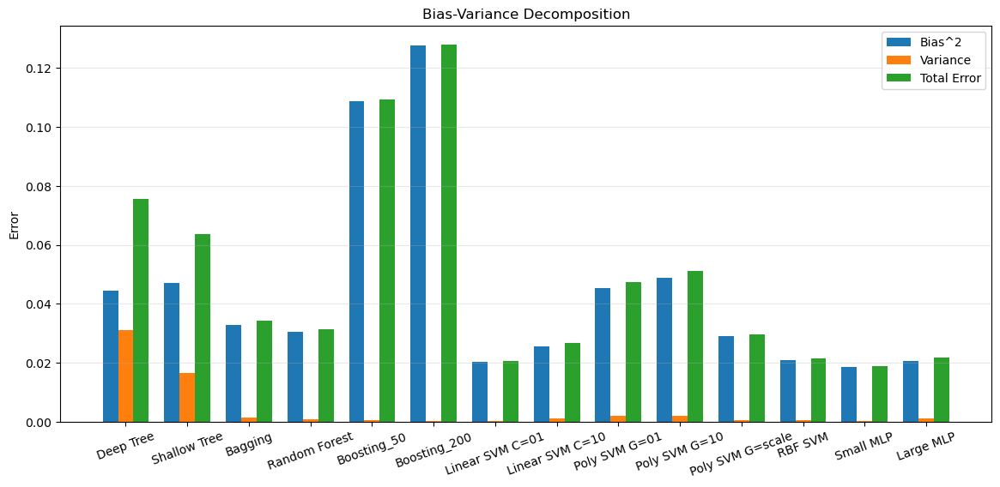

In [12]:
# Visualization

names = list(results.keys())

biases = [results[m]['Bias^2'] for m in names]
variances = [results[m]['Variance'] for m in names]
errors = [results[m]['Total Error'] for m in names]

x = np.arange(len(names))
width = 0.25

plt.figure(figsize=(14,6))

plt.bar(x - width, biases, width, label='Bias^2')
plt.bar(x, variances, width, label='Variance')
plt.bar(x + width, errors, width, label='Total Error')
plt.xticks(x, names, rotation=20)
plt.ylabel('Error')
plt.title('Bias-Variance Decomposition')
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.show()

Interpretação dos Resultados


Nas Árvores de Decisão obtivemos o que estávamos à espera: uma maior variância e menor viés na Árvore mais profunda do que na outra Árvore. Isto deve-se à maior adaptação aos dados de treino e maior sensibilidade às pequenas mudanças nos dados da Árvore mais profunda.

Com as técnicas de Ensemble conseguimos observar a esperada queda na variância (e no erro total) comparando com as Árvores de Decisão. Com Bagging já conseguimos detetar uma redução de variância significativa, mas detetámos uma maior redução com Random Forest, que é o resultado esperado. Mas com a técnica de Boosting vimos algo interessante. Houve uma pequena redução de variância comparando com Random Forest, mas um aumento muito grande no viés e o viés aumenta mais com o aumento do número de estimadores. No entanto, analisando o desempenho do modelo, através da accuracy, este é o modelo com melhor desempenho, com 97% e 98% de accuracy (no caso do Boosting com 50 e 200 estimadores, respetivamente). O que parece uma contradição, pois se tem um melhor desempenho a classificar os dados, não deveria ter um maior valor de viés. O viés elevado está normalmente associado a modelos demasiado simples, que não conseguem capturar adequadamente a estrutura dos dados (underfitting). No entanto, neste caso, a accuracy sugere que o aumento observado no viés poderá resultar da forma empírica como este foi estimado e não de uma perda real de capacidade preditiva. O que poderá estar a acontecer é o seguinte: seja uma observação x com a classe 1. Através de Random Forest, mean_pred = 0.95, ou seja, a média da probabilidade de x ser da classe 1, através desse modelo é 95%. Portanto o quadrado do viés é (0.95 - 1)**2 = 0.0025. Através de Boosting, mean_pred = 0.80, logo o quadrado do viés é (0.80 - 1)**2 = 0.04, que é muito maior que o anterior. No entanto, ambos classificaram corretamente a classe da observação x. Portanto o que pode estar a acontecer é que AdaBoost pode estar a produzir previsões menos extremas, mais conservadoras e mais estáveis (o que explica a pequena variância).

Nos Support Vector Machine (SVM), observámos o comportamento esperado. Com o aumento do parâmetro C, aumentámos a variância, pois estamos a criar uma fronteira mais complexa. O aumento de gamma não produziu alterações substanciais na variância para este conjunto de dados. Quanto ao viés, este aumentou também, o que não seria de esperar. Talvez pela razão dada quando foi abordado o Boosting. Conseguimos notar também que, neste caso, ao usar o kernel Linear obtemos um viés e uma variância maior do que usando o kernel RBF, isto sugere que existe alguma não linearidade na relação entre as variáveis do Breast Cancer Wisconsin dataset, que é melhor capturada pelo kernel RBF, mas isto não se traduziu numa melhoria significativa de accuracy para o modelo SVM-RBF.

Com Multi-Layer Perceptron (MLP), observámos um ligeiro aumento da variância quando aumentámos a complexidade da rede, o que está de acordo com a teoria. No entanto, o viés também aumentou ligeiramente. Este resultado sugere que a rede maior não trouxe benefícios relevantes para este conjunto de dados, podendo até ter introduzido alguma instabilidade adicional durante o processo de treino. Apesar disso, ambos os modelos apresentaram valores de accuracy muito elevados (aproximadamente 98%), indicando que a diferença prática entre eles é reduzida.

Em geral, observou-se que modelos com menor erro total (Bias² + Variance) tendem também a apresentar maior accuracy. No entanto, esta relação não é perfeita, especialmente no caso do AdaBoost, o que sugere que a decomposição utilizada deve ser interpretada como uma aproximação empírica e não como a decomposição teórica exata.

Globalmente, os resultados confirmam o trade-off bias-variance estudado teoricamente. Modelos mais flexíveis tendem a apresentar menor viés e maior variância, enquanto técnicas de ensemble conseguem reduzir significativamente a variância sem aumentar substancialmente o viés. Os modelos SVM e MLP apresentaram o melhor equilíbrio entre viés e variância neste conjunto de dados, alcançando também as maiores accuracies.